#  Melanoma Classification Using Fourier Vision Transformers
## Abstract
This project aims to implement a novel approach for melanoma classification by leveraging the Fourier Vision Transformer (ViT) model. The methodology begins with the implementation of a traditional Convolutional Neural Network (CNN) to establish a baseline for performance. Subsequently, the project enhances the traditional ViT architecture by incorporating Fourier transform features, aiming to improve classification accuracy. The results of both models are compared to evaluate the effectiveness of integrating Fourier features into the ViT framework for melanoma classification.


In [1]:
import numpy as np 
import pandas as pd 
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9697.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10087.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9618.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9614.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9862.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9838.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9851.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9691.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/

dataset

In [30]:
## train data 
train_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'

## test data 
test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

In [29]:
benign_data ='/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign'
malignant_data ='/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/malignant'

In [28]:
import pandas as pd 
import numpy as np 
import os
import glob as gb
import matplotlib.pyplot as plt 
import cv2

## Dataset

The dataset used for this project consists of **10,000 images** of skin lesions, specifically designed for melanoma classification. The dataset is divided into two main categories: **benign** and **malignant** lesions. 

### Dataset Structure
- **Training Set**: 9,600 images
  - **Benign**: 4,800 images
  - **Malignant**: 4,800 images
- **Validation Set**: 1,000 images
  - **Benign**: 500 images
  - **Malignant**: 500 images


In [31]:
train_images = []
train_labels = []
class_ = {'benign': 0, 'malignant': 1}



# open train data folder (os, glob)
for folder in os.listdir(train_data):
    folder_path = os.path.join(train_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        image_count = 0  # counter for processed images in this folder
              # read train images
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                train_images.append(image_resized)
                train_labels.append(class_[folder])
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")
        
        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")
# Final output
print(f"Total images processed: {len(train_images)}")
print(f"Total labels assigned: {len(train_labels)}")

Processing folder: benign
Found 5000 images in folder benign
Processed 5000 images from folder benign
Processing folder: malignant
Found 4605 images in folder malignant
Processed 4605 images from folder malignant
Total images processed: 9605
Total labels assigned: 9605


In [32]:
import os
import glob as gb
import cv2


# Initialize lists for test images and labels
test_images = []
test_labels = []
class_ = {'benign': 0, 'malignant': 1}

# open train data folder (os, glob)
for folder in os.listdir(test_data):
    folder_path = os.path.join(test_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        image_count = 0  # counter for processed images in this folder
              # read test images
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                test_images.append(image_resized)
                test_labels.append(class_[folder])
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")
        
        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")
# Final output
print(f"Total images processed: {len(test_images)}")
print(f"Total labels assigned: {len(test_labels)}")


Processing folder: benign
Found 500 images in folder benign
Processed 500 images from folder benign
Processing folder: malignant
Found 500 images in folder malignant
Processed 500 images from folder malignant
Total images processed: 1000
Total labels assigned: 1000


In [ ]:
import tensorflow as tf

# Check if GPU is available
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


In [ ]:
import tensorflow as tf

# Check if TPU is available
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    print("TPU is available and connected.")
except ValueError:
    print("TPU is not available.")


In [ ]:
# List available devices
devices = tf.config.list_logical_devices()
for device in devices:
    print(device)


In [ ]:
!nvidia-smi


In [ ]:
# Detect hardware, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection. No parameters necessary if TPU_NAME environment variable is set. On Kaggle this is always the case.
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() # default distribution strategy in Tensorflow. Works on CPU and single GPU.

print("REPLICAS: ", strategy.num_replicas_in_sync)

In [ ]:
!pip install tpu_tools


In [ ]:
pip install --upgrade pip

In [ ]:
import tpu_tools

# Display TPU performance metrics
tpu_tools.show_metrics()


In [ ]:
import torch

# Check if GPU is available
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available, using:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("GPU not available, using CPU.")


In [ ]:
with tf.device('/GPU:0'):
    # Build and compile your model here
    model = ... 


## Data Augmentation

Data augmentation is a crucial technique in deep learning that enhances the diversity of the training dataset by applying various transformations to the original images. This helps improve the robustness of the model and reduces overfitting by creating new, slightly altered versions of the training images. 

In this project, we use the **ImageDataGenerator** class from TensorFlow's Keras API to perform data augmentation on the training images.

### Data Augmentation Techniques

The following transformations are applied to the images:

- **Normalization**: The pixel values are rescaled to a range of 0 to 1 by dividing by 255.
- **Rotation**: Random rotations of up to 20 degrees are applied to the images to simulate different orientations.
- **Zoom**: A random zoom of up to 15% is applied to the images to improve the model's ability to recognize objects at various scales.
- **Width Shift**: The images can be shifted horizontally by 20% to introduce slight variations in position.
- **Height Shift**: Similar to width shift, the images can be shifted vertically by 20%.
- **Shear**: A shear transformation (a type of distortion) is applied with a range of 15 degrees in a counter-clockwise direction.
- **Horizontal Flip**: Images are randomly flipped horizontally to create mirror images, allowing the model to learn from mirrored variations.
- **Fill Mode**: Missing pixels created by transformations are filled using the nearest pixel values.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation generator
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize the pixel values
    rotation_range=20,  # Randomly rotate images by 20 degrees
    zoom_range=0.15,  # Randomly zoom images
    width_shift_range=0.2,  # Shift horizontally by 20%
    height_shift_range=0.2,  # Shift vertically by 20%
    shear_range=0.15,  # Shear angle in a counter-clockwise direction
    horizontal_flip=True,  # Randomly flip images
    fill_mode="nearest"  # Fill any missing pixels after rotation
)

# Generate augmented images
train_generator = datagen.flow(
    np.array(train_images), 
    np.array(train_labels),
    batch_size=32
)

# Print how many images were augmented
print(f"Augmented {len(train_images)} images for training.")


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of ImageDataGenerator for training images
train_datagen = ImageDataGenerator(rescale=1./255)  # Normalizing images
test_datagen = ImageDataGenerator(rescale=1./255)

# Load images from directories (you'll need to adjust paths)
train_generator = train_datagen.flow_from_directory(
    train_data,  # Adjust to your train data directory
    target_size=(224, 224),
    batch_size=32,  # Adjust based on available memory
    class_mode='binary'  # Adjust for your specific case
)

test_generator = test_datagen.flow_from_directory(
    test_data,  # Adjust to your test data directory
    target_size=(224, 224),
    batch_size=32,  # Adjust based on available memory
    class_mode='binary'  # Adjust for your specific case
)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation generator
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize the pixel values
    rotation_range=20,  # Randomly rotate images by 20 degrees
    zoom_range=0.15,  # Randomly zoom images
    width_shift_range=0.2,  # Shift horizontally by 20%
    height_shift_range=0.2,  # Shift vertically by 20%
    shear_range=0.15,  # Shear angle in a counter-clockwise direction
    horizontal_flip=True,  # Randomly flip images
    fill_mode="nearest"  # Fill any missing pixels after rotation
)

# Generate augmented images
train_generator = datagen.flow(
    np.array(train_images), 
    np.array(train_labels),
    batch_size=32
)

# Print how many images were augmented
print(f"Augmented {len(test_images)} images for training.")


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm

# Function to resize images
def resize_images(images, target_size=(224, 224)):
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, target_size)  # Resize image
        resized_images.append(resized_img)
    return np.array(resized_images)

# Resize your training images (assuming train_images is a list of images)
train_images_resized = resize_images(np.array(train_images))

# Define data augmentation generator
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize the pixel values
    rotation_range=20,  # Randomly rotate images by 20 degrees
    zoom_range=0.15,  # Randomly zoom images
    width_shift_range=0.2,  # Shift horizontally by 20%
    height_shift_range=0.2,  # Shift vertically by 20%
    shear_range=0.15,  # Shear angle in a counter-clockwise direction
    horizontal_flip=True,  # Randomly flip images
    fill_mode="nearest"  # Fill any missing pixels after rotation
)

# Generate augmented images
train_generator = datagen.flow(
    train_images_resized, 
    np.array(train_labels),  # Ensure train_labels is properly defined
    batch_size=32
)

# Print how many images were augmented
print(f"Augmented {len(train_images_resized)} images for training.")

# Display a few augmented images with tqdm
def display_augmented_images(generator, num_images=2):
    plt.figure(figsize=(10, 5))
    for i in tqdm(range(num_images), desc="Displaying Augmented Images"):
        img, _ = next(generator)  # Get a batch of augmented images
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img[0])  # Display the first image in the batch
        plt.axis('off')
    plt.show()

# Display 2 augmented images
display_augmented_images(train_generator, num_images=2)


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm

# Function to resize images
def resize_images(images, target_size=(224, 224)):
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, target_size)  # Resize image
        resized_images.append(resized_img)
    return np.array(resized_images)

# Resize your training images (assuming train_images is a list of images)
train_images_resized = resize_images(np.array(test_images))

# Define data augmentation generator
datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize the pixel values
    rotation_range=20,  # Randomly rotate images by 20 degrees
    zoom_range=0.15,  # Randomly zoom images
    width_shift_range=0.2,  # Shift horizontally by 20%
    height_shift_range=0.2,  # Shift vertically by 20%
    shear_range=0.15,  # Shear angle in a counter-clockwise direction
    horizontal_flip=True,  # Randomly flip images
    fill_mode="nearest"  # Fill any missing pixels after rotation
)

# Generate augmented images
test_generator = datagen.flow(
    test_images_resized, 
    np.array(test_labels),  # Ensure train_labels is properly defined
    batch_size=32
)

# Print how many images were augmented
print(f"Augmented {len(test_images_resized)} images for testing.")

# Display a few augmented images with tqdm
def display_augmented_images(generator, num_images=2):
    plt.figure(figsize=(10, 5))
    for i in tqdm(range(num_images), desc="Displaying Augmented Images"):
        img, _ = next(generator)  # Get a batch of augmented images
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img[0])  # Display the first image in the batch
        plt.axis('off')
    plt.show()

# Display 2 augmented images
display_augmented_images(test_generator, num_images=2)


In [ ]:
pip install tqdm


In [ ]:
import random

# List of benign and malignant image paths
benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9666.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9684.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9675.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9828.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9897.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9706.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10221.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10303.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10529.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10528.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10389.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10130.jpg",
]

# Select 3 random benign and malignant image paths
random_benign = random.sample(benign_paths, 3)
random_malignant = random.sample(malignant_paths, 3)

random_benign, random_malignant


In the Fourier ViT paper, the Fourier transform is used to extract frequency-based features from the images, which are then combined with spatial features extracted by the Vision Transformer.



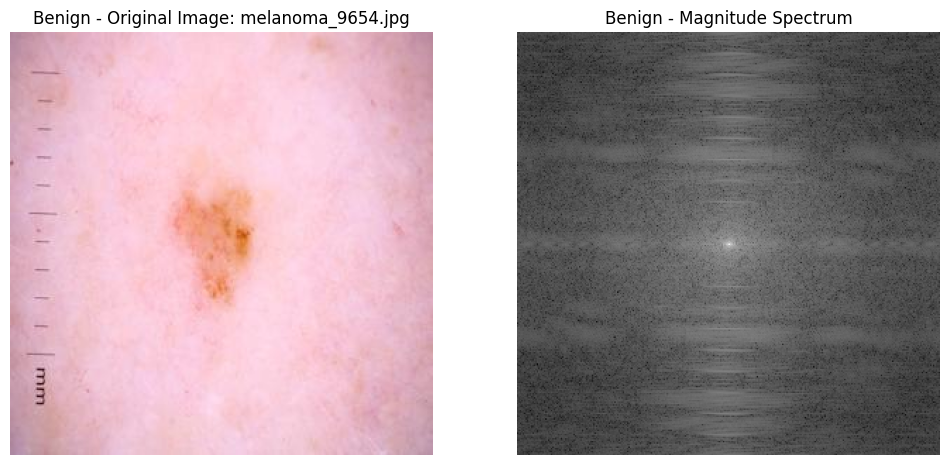

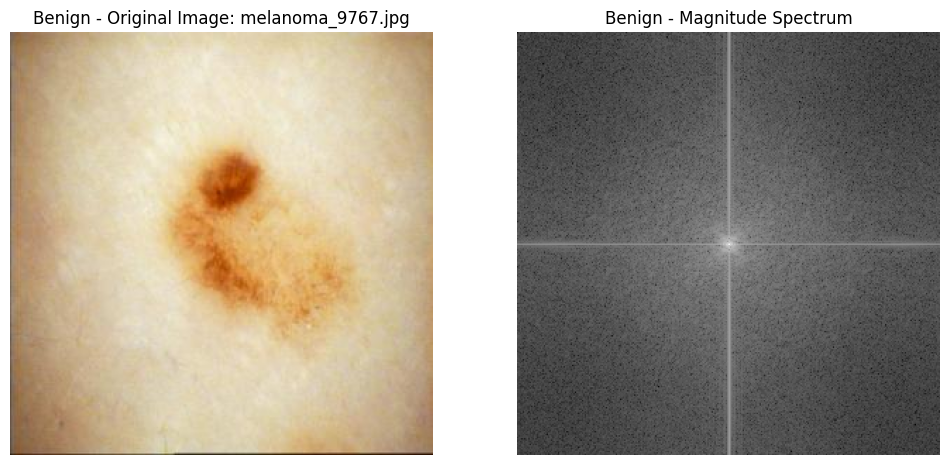

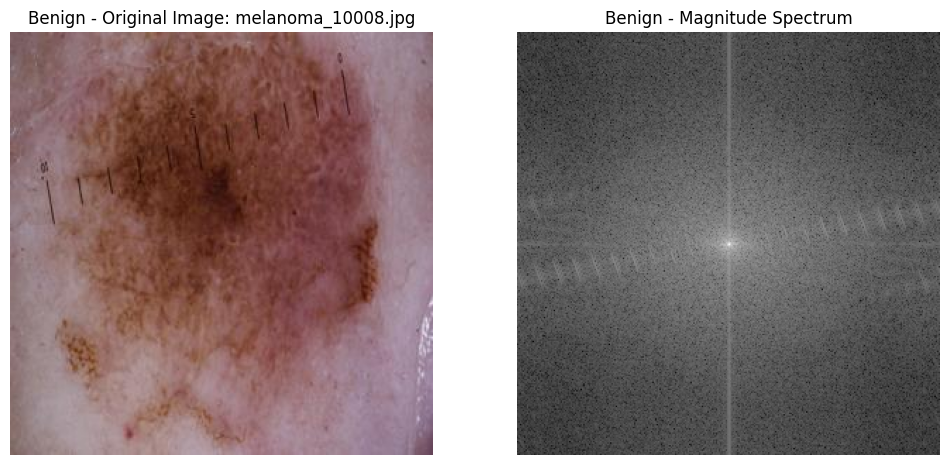

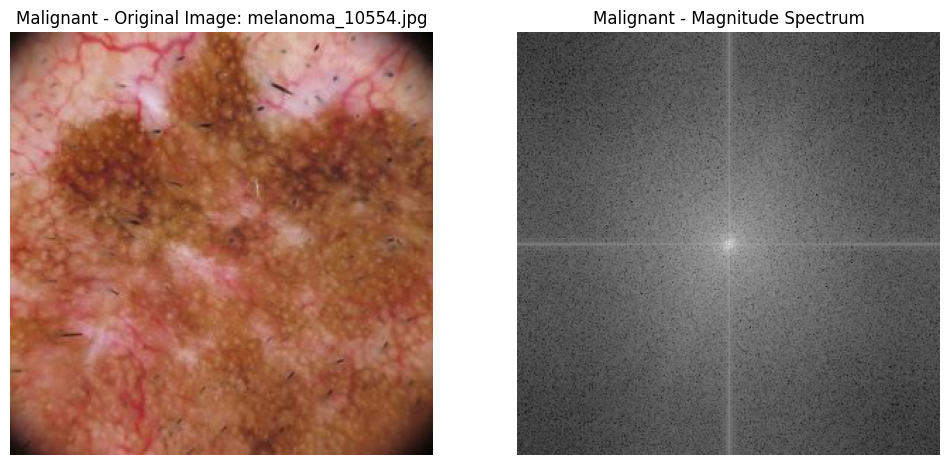

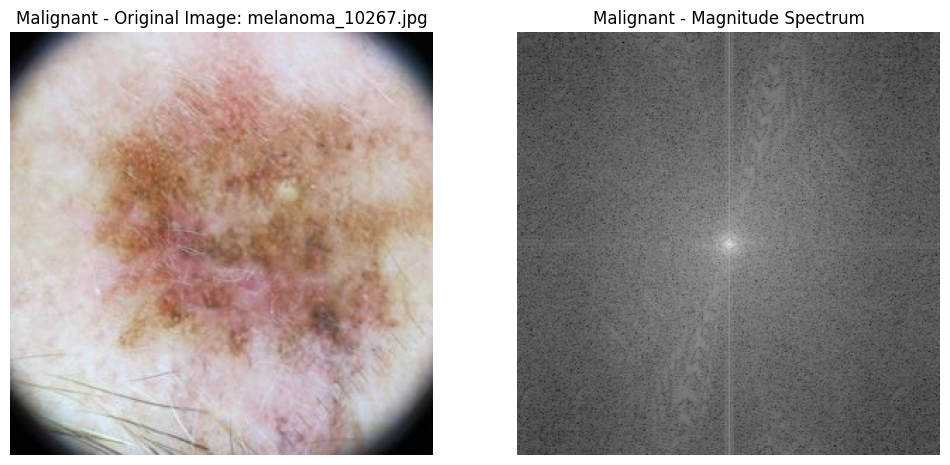

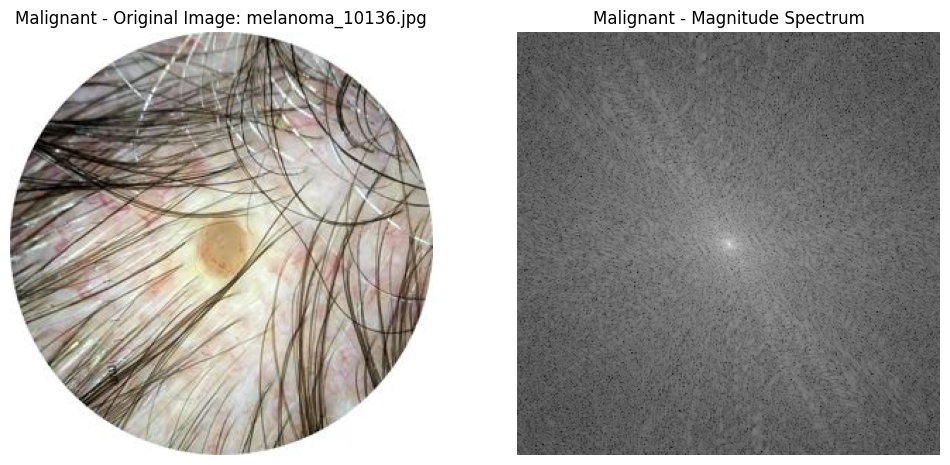

In [33]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to apply Fourier Transform to an image
def apply_fourier_transform(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply the 2D FFT (Fast Fourier Transform)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    
    # Get the magnitude spectrum
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Add 1 to avoid log(0)
    
    # Return both the transformed image and the magnitude spectrum
    return fshift, magnitude_spectrum

# List of benign and malignant image paths
benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
]

# Function to process and display images
def process_and_display_images(image_paths, title_prefix):
    for path in image_paths:
        # Read the image
        image = cv2.imread(path)

        # Apply Fourier Transform
        transformed_image, mag_spectrum = apply_fourier_transform(image)

        # Show the result
        plt.figure(figsize=(12, 6))
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{title_prefix} - Original Image: {path.split("/")[-1]}')
        plt.axis('off')

        plt.subplot(122)
        plt.imshow(mag_spectrum, cmap='gray')
        plt.title(f'{title_prefix} - Magnitude Spectrum')
        plt.axis('off')

        plt.show()

# Process and display benign images
process_and_display_images(benign_paths, 'Benign')

# Process and display malignant images
process_and_display_images(malignant_paths, 'Malignant')


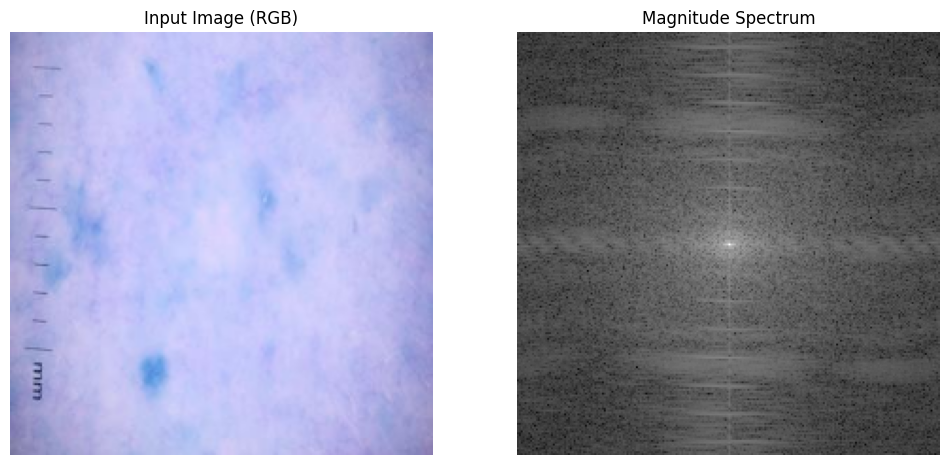

In [34]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to apply Fourier Transform to an image
def apply_fourier_transform(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply the 2D FFT (Fast Fourier Transform)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    
    # Get the magnitude spectrum
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Add 1 to avoid log(0)
    
    return magnitude_spectrum

# Load and preprocess the specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign/melanoma_995.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.cast(image, tf.float32) / 255.0  # Convert to float32 and normalize

# Convert to numpy array for OpenCV processing
image_np = tf.squeeze(image).numpy() * 255  # Scale back to [0, 255]
image_np = image_np.astype(np.uint8)  # Convert to uint8 for OpenCV

# Apply Fourier Transform to get the magnitude spectrum
magnitude_spectrum = apply_fourier_transform(image_np)

# Prepare for visualization
output_image_np = image_np  # Original grayscale image
magnitude_np = magnitude_spectrum  # Magnitude spectrum

# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
ax[0].imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))  # Original RGB image
ax[0].set_title('Input Image (RGB)')
ax[0].axis('off')

# Display magnitude spectrum
ax[1].imshow(magnitude_np, cmap='gray')  # Magnitude Spectrum
ax[1].set_title('Magnitude Spectrum')
ax[1].axis('off')

plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt

# Function to apply Fourier Transform to an image
def apply_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Add 1 to avoid log(0)
    return fshift, magnitude_spectrum

# Function to apply Wavelet Transform to an image
def apply_wavelet_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply 2D Wavelet Transform using 'haar' wavelet
    coeffs2 = pywt.wavedec2(gray, 'haar', level=2)

    # Extract coefficients
    cA = coeffs2[0]  # Approximation coefficients
    cH = coeffs2[1][0]  # Horizontal detail coefficients from first level
    cV = coeffs2[1][1]  # Vertical detail coefficients from first level
    cD = coeffs2[1][2]  # Diagonal detail coefficients from first level
    
    return cA, cH, cV, cD

# List of benign and malignant image paths
benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
]

# Function to process and display images
def process_and_display_images(image_paths, title_prefix):
    for path in image_paths:
        # Read the image
        image = cv2.imread(path)

        # Apply Fourier Transform
        transformed_image, mag_spectrum = apply_fourier_transform(image)

        # Apply Wavelet Transform
        cA, cH, cV, cD = apply_wavelet_transform(image)

        # Show the results
        plt.figure(figsize=(15, 10))

        # Original Image and Fourier Transform Magnitude Spectrum
        plt.subplot(2, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{title_prefix} - Original Image: {path.split("/")[-1]}')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(mag_spectrum, cmap='gray')
        plt.title(f'{title_prefix} - Fourier Magnitude Spectrum')
        plt.axis('off')

        # Wavelet Transform Results
        plt.subplot(2, 2, 3)
        plt.imshow(cA, cmap='gray')
        plt.title(f'{title_prefix} - Wavelet Approximation (cA)')
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(cH, cmap='gray')
        plt.title(f'{title_prefix} - Wavelet Horizontal Detail (cH)')
        plt.axis('off')

        plt.show()

# Process and display benign images
process_and_display_images(benign_paths, 'Benign')

# Process and display malignant images
process_and_display_images(malignant_paths, 'Malignant')


In [ ]:
pip install PyWavelets


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def improved_masking(image):
    if image is None:
        print("Error: Image not found.")
        return None, None, None, None, None

    # Convert the image to grayscale if it's a color image
    if image.shape[2] == 3:
        originalGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        originalGray = image  # If it's already grayscale
    
    # Compute the histogram
    histogramValues = cv2.calcHist([originalGray], [0], None, [256], [0, 256])
    
    # Find the intensity with the highest number of pixels
    intensity = np.argmax(histogramValues)
    
    # Define the range around the peak intensity
    range_val = 35
    lowerThreshold = max(0, intensity - range_val)
    upperThreshold = min(255, intensity + range_val)
    
    # Create a binary mask using the intensity range
    mask = cv2.inRange(originalGray, np.array([lowerThreshold]), np.array([upperThreshold]))
    
    # Use the mask to preserve the original color information
    resultImage = image.copy()
    resultImage[np.where(mask == 0)] = 0
    
    # Optionally apply Gaussian blur to the mask for smoother edges
    mask_blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Create a colored mask for visualization
    colored_mask = cv2.applyColorMap(mask_blurred, cv2.COLORMAP_JET)

    # Combine original image and colored mask
    combined = cv2.addWeighted(resultImage, 0.7, colored_mask, 0.3, 0)

    return resultImage, mask, mask_blurred, colored_mask, combined

# Function to visualize multiple images with error handling
def visualize_masks(image_paths):
    plt.figure(figsize=(15, 10))

    for idx, image_path in enumerate(image_paths):
        # Check if the image file exists
        if not os.path.exists(image_path):
            print(f"Warning: {image_path} does not exist.")
            continue
        
        image = cv2.imread(image_path)
        resultImage, mask, mask_blurred, colored_mask, combined = improved_masking(image)

        if resultImage is None:
            continue  # Skip to the next image if there was an error

        plt.subplot(len(image_paths), 5, idx * 5 + 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title('Binary Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 3)
        plt.imshow(mask_blurred, cmap='gray')
        plt.title('Blurred Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 4)
        plt.imshow(cv2.cvtColor(colored_mask, cv2.COLOR_BGR2RGB))
        plt.title('Colored Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 5)
        plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
        plt.title('Combined Visualization')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
image_paths = [
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10000.jpg',
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10115.jpg',
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10133.jpg'
]
visualize_masks(image_paths)


## Fourier Transform Preprocessing

Fourier Transform is a powerful mathematical technique used to convert spatial domain data (images) into frequency domain representations. In this project, we leverage Fourier Transform to extract meaningful features from the melanoma images, enhancing the capability of our model to classify benign and malignant cases.

### Methodology
The Fourier Transform process involves the following steps:

1. **Grayscale Conversion**: Each image is converted from BGR (or RGB) to grayscale, reducing complexity while retaining essential information.
2. **2D Fast Fourier Transform (FFT)**: The 2D FFT is applied to the grayscale image, which transforms the image into its frequency components.
3. **Magnitude and Phase Spectrum**: The FFT output consists of a magnitude spectrum and a phase spectrum:
   - **Magnitude Spectrum**: Represents the intensity of the frequency components.
   - **Phase Spectrum**: Encodes the spatial arrangement of these frequencies.

4. **Normalization**: The magnitude spectrum is normalized using a logarithmic scale to improve numerical stability and enhance model performance.


In [ ]:
print(f"Total test images loaded: {len(test_images)}")


In [35]:
import numpy as np
import cv2
from tqdm import tqdm

# Function to apply Fourier Transform to an image and return magnitude & phase
def apply_full_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

    # Apply 2D FFT (Fast Fourier Transform)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)  # Shift zero frequency component to the center

    # Get magnitude and phase spectrum
    magnitude_spectrum = np.abs(fshift)
    phase_spectrum = np.angle(fshift)

    # Normalize magnitude for better performance
    magnitude_spectrum = np.log(1 + magnitude_spectrum)

    # Resize if needed for consistent input size (e.g., 224x224 for ViT)
    magnitude_spectrum = cv2.resize(magnitude_spectrum, (224, 224))
    phase_spectrum = cv2.resize(phase_spectrum, (224, 224))

    return magnitude_spectrum, phase_spectrum

# Applying this to the dataset with tqdm to track progress
def preprocess_with_fourier(images):
    fourier_images = []
    for image in tqdm(images, desc="Applying Fourier Transform", unit="image"):
        magnitude, phase = apply_full_fourier_transform(image)
        combined_spectrum = np.stack([magnitude, phase], axis=-1)  # Combine mag & phase
        fourier_images.append(combined_spectrum)
    return np.array(fourier_images)

# Assuming train_images and test_images are loaded datasets of shape (num_images, height, width, channels)
train_images_fourier = preprocess_with_fourier(train_images)
test_images_fourier = preprocess_with_fourier(test_images)

print(f"Processed {len(train_images_fourier)} Fourier-transformed training images.")
print(f"Processed {len(test_images_fourier)} Fourier-transformed test images.")


Applying Fourier Transform: 100%|██████████| 1000/1000 [00:00<00:00, 1445.48image/s]


Processed 9605 Fourier-transformed training images.
Processed 1000 Fourier-transformed test images.


In [ ]:
import numpy as np
import cv2
import pywt  # PyWavelets for Wavelet Transform
from tqdm import tqdm
import gc  # For garbage collection

# Function to apply Wavelet Transform to an image and return approximation and details
def apply_wavelet_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

    # Apply 2D Wavelet Transform
    coeffs2 = pywt.wavedec2(gray, 'haar', level=2)  # Change 'haar' to any wavelet of your choice
    
    # Extracting coefficients
    cA = coeffs2[0]  # Approximation coefficients
    cH = coeffs2[1][0]  # Horizontal detail coefficients
    cV = coeffs2[1][1]  # Vertical detail coefficients
    cD = coeffs2[1][2]  # Diagonal detail coefficients

    # Normalize and resize the coefficients
    cA_resized = cv2.resize(cA, (224, 224))
    cH_resized = cv2.resize(cH, (224, 224))
    cV_resized = cv2.resize(cV, (224, 224))
    cD_resized = cv2.resize(cD, (224, 224))

    # Combine coefficients into a single image for visualization
    combined_wavelet = np.stack([cA_resized, cH_resized, cV_resized, cD_resized], axis=-1)

    return combined_wavelet

# Applying this to the dataset with tqdm to track progress
def preprocess_with_wavelet(images, batch_size=100):
    wavelet_images = []
    for i in tqdm(range(0, len(images), batch_size), desc="Applying Wavelet Transform"):
        batch = images[i:i + batch_size]  # Get the current batch
        for image in batch:
            wavelet_image = apply_wavelet_transform(image)
            wavelet_images.append(wavelet_image)
        
        # Clear unreferenced objects
        del batch
        gc.collect()  # Force garbage collection to free memory
        
    return np.array(wavelet_images)

# Assuming train_images and test_images are loaded datasets of shape (num_images, height, width, channels)
train_images_wavelet = preprocess_with_wavelet(train_images)
test_images_wavelet = preprocess_with_wavelet(test_images)

print(f"Processed {len(train_images_wavelet)} Wavelet-transformed training images.")
print(f"Processed {len(test_images_wavelet)} Wavelet-transformed test images.")


In [ ]:
import numpy as np
import pandas as pd
import cv2
import os
import glob as gb
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

train_images = []
train_labels = []
test_images = []
test_labels = []

class_ = {'benign': 0, 'malignant': 1}

# Load train images
for folder in os.listdir(train_data):
    folder_path = os.path.join(train_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        image_count = 0
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                train_images.append(image_resized)
                train_labels.append(class_[folder])  # Assign label based on folder
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")
        
        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")

print(f"Total train images processed: {len(train_images)}")
print(f"Total train labels assigned: {len(train_labels)}")

# Load test images
for folder in os.listdir(test_data):
    folder_path = os.path.join(test_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        image_count = 0
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                test_images.append(image_resized)
                test_labels.append(class_[folder])  # Assign label based on folder
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")
        
        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")

print(f"Total test images processed: {len(test_images)}")
print(f"Total test labels assigned: {len(test_labels)}")

#Fourier Transform Preprocessing
from tqdm import tqdm  

# return magnitude & phase
def apply_full_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

    # Apply 2D FFT (Fast Fourier Transform)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)  # Shift zero frequency component to the center

    # Get magnitude and phase spectrum
    magnitude_spectrum = np.abs(fshift)
    phase_spectrum = np.angle(fshift)

    # Normalize for better performance
    magnitude_spectrum = np.log(1 + magnitude_spectrum)

    return magnitude_spectrum, phase_spectrum


def preprocess_with_fourier(images):
    fourier_images = []
    for image in tqdm(images, desc="Applying Fourier Transform", unit="image"):
        magnitude, phase = apply_full_fourier_transform(image)
        combined_spectrum = np.stack([magnitude, phase], axis=-1)  # Combine mag & phase
        fourier_images.append(combined_spectrum)
    return np.array(fourier_images)


train_images_fourier = preprocess_with_fourier(train_images)
test_images_fourier = preprocess_with_fourier(test_images)

print(f"Processed {len(train_images_fourier)} Fourier-transformed training images.")
print(f"Processed {len(test_images_fourier)} Fourier-transformed test images.")


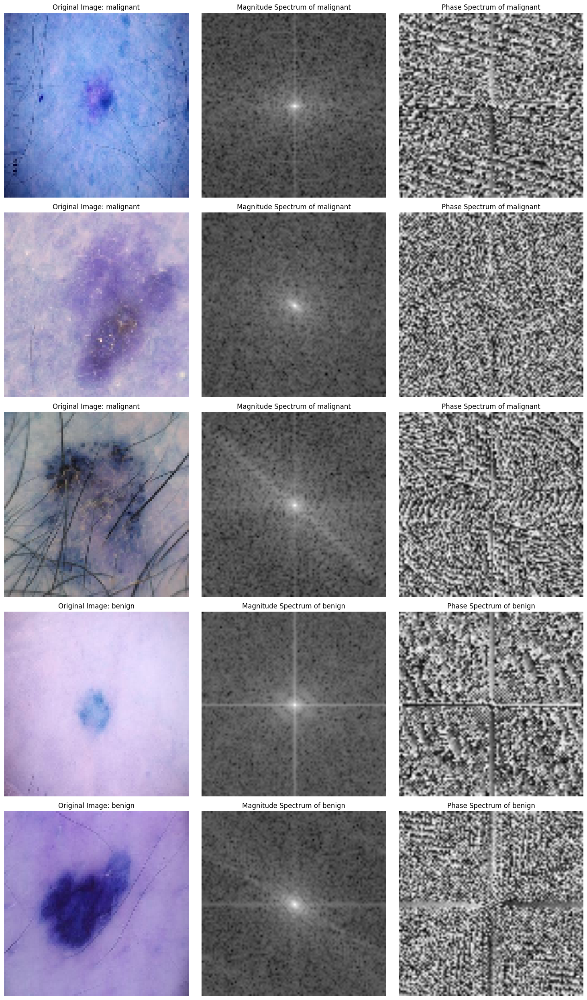

In [36]:
import matplotlib.pyplot as plt
import random

def plot_images_with_fourier(images, labels, class_labels, num_images=5):
    fig, axes = plt.subplots(num_images, 3, figsize=(15, num_images * 5))
    for i in range(num_images):
        # Randomly select a benign or malignant image
        label = random.choice(class_labels) 
        if label == 'benign':
            index = random.choice([j for j in range(len(train_labels)) if train_labels[j] == class_['benign']])
        else:
            index = random.choice([j for j in range(len(train_labels)) if train_labels[j] == class_['malignant']])

        # Original image
        image = images[index]
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Original Image: {label}")
        axes[i, 0].axis('off')


        magnitude, phase = apply_full_fourier_transform(image)
        
        # Magnitude Spectrum
        axes[i, 1].imshow(magnitude, cmap='gray')
        axes[i, 1].set_title(f"Magnitude Spectrum of {label}")
        axes[i, 1].axis('off')

        # Phase Spectrum
        axes[i, 2].imshow(phase, cmap='gray')
        axes[i, 2].set_title(f"Phase Spectrum of {label}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize a few benign and malignant images
plot_images_with_fourier(train_images, train_labels, ['benign', 'malignant'], num_images=5)


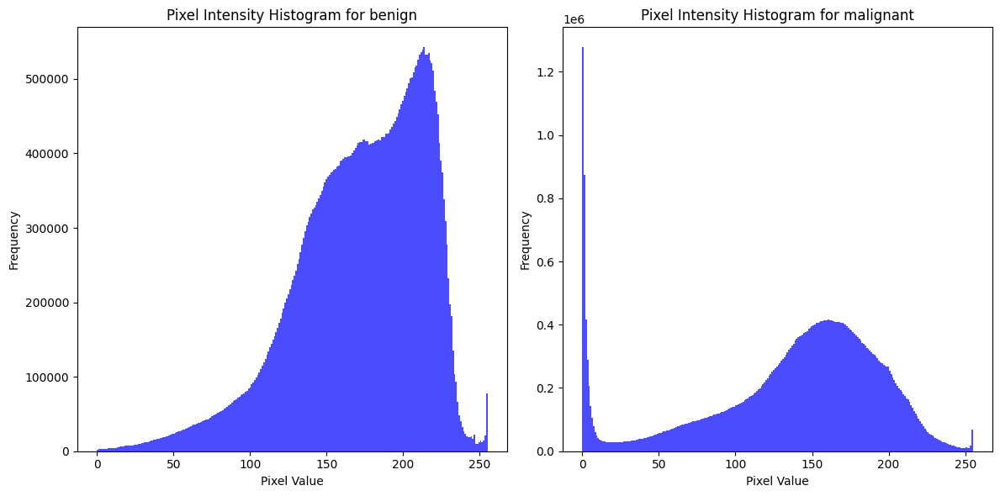

In [37]:
def plot_pixel_histograms(images, labels, class_labels):
    plt.figure(figsize=(12, 6))
    
    for i, label in enumerate(class_labels):
        class_indices = [j for j in range(len(labels)) if labels[j] == class_[label]]
        pixels = np.concatenate([cv2.cvtColor(images[idx], cv2.COLOR_BGR2GRAY).ravel() for idx in class_indices])
        
        plt.subplot(1, len(class_labels), i + 1)
        plt.hist(pixels, bins=256, color='blue', alpha=0.7)
        plt.title(f'Pixel Intensity Histogram for {label}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

# Plot histograms for both classes
plot_pixel_histograms(train_images, train_labels, ['benign', 'malignant'])


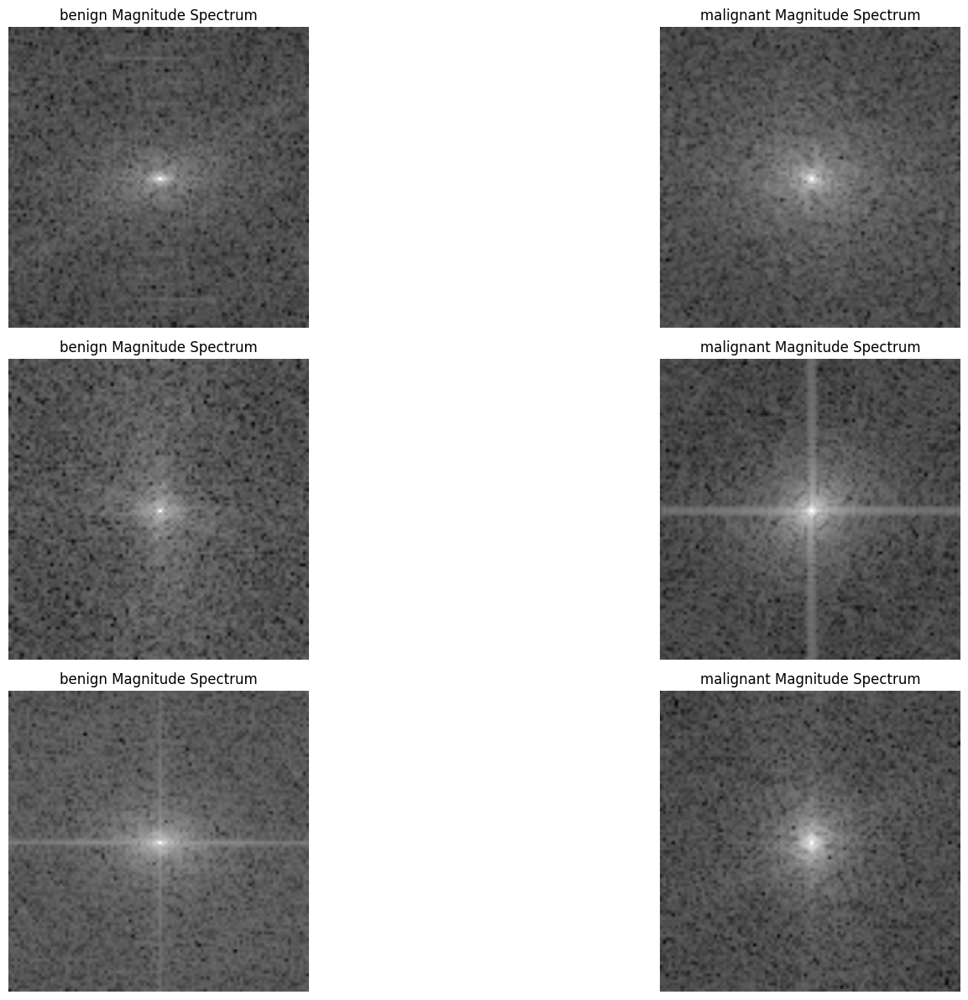

In [38]:
def plot_magnitude_comparison(images, labels, class_labels, num_samples=5):
    plt.figure(figsize=(20, num_samples * 4))
    
    for i, label in enumerate(class_labels):
        class_indices = [j for j in range(len(labels)) if labels[j] == class_[label]]
        sampled_indices = np.random.choice(class_indices, num_samples, replace=False)
        
        for j, idx in enumerate(sampled_indices):
            image = images[idx]
            magnitude, _ = apply_full_fourier_transform(image)
            
            plt.subplot(num_samples, len(class_labels), j * len(class_labels) + i + 1)
            plt.imshow(magnitude, cmap='gray')
            plt.title(f"{label} Magnitude Spectrum")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Compare magnitude spectra for both classes
plot_magnitude_comparison(train_images, train_labels, ['benign', 'malignant'], num_samples=3)


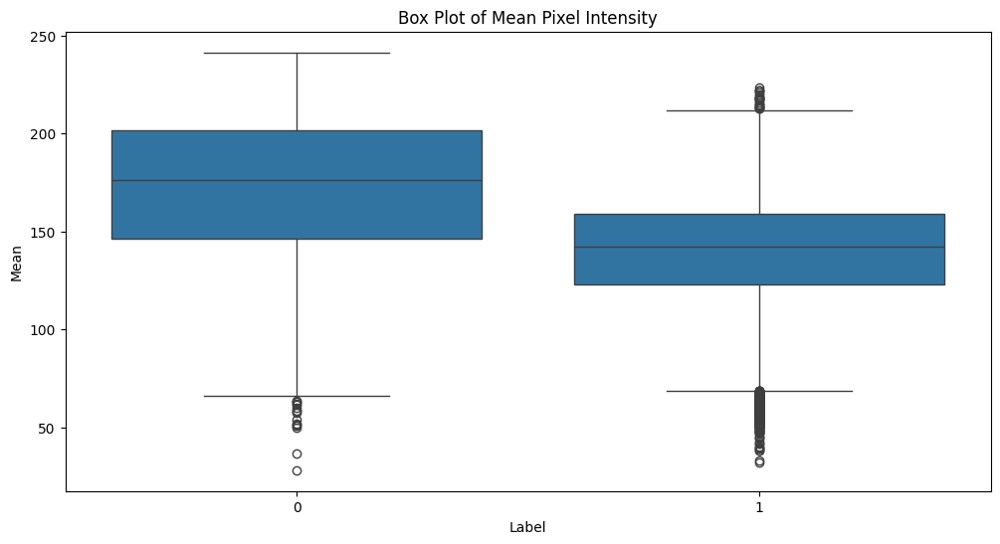

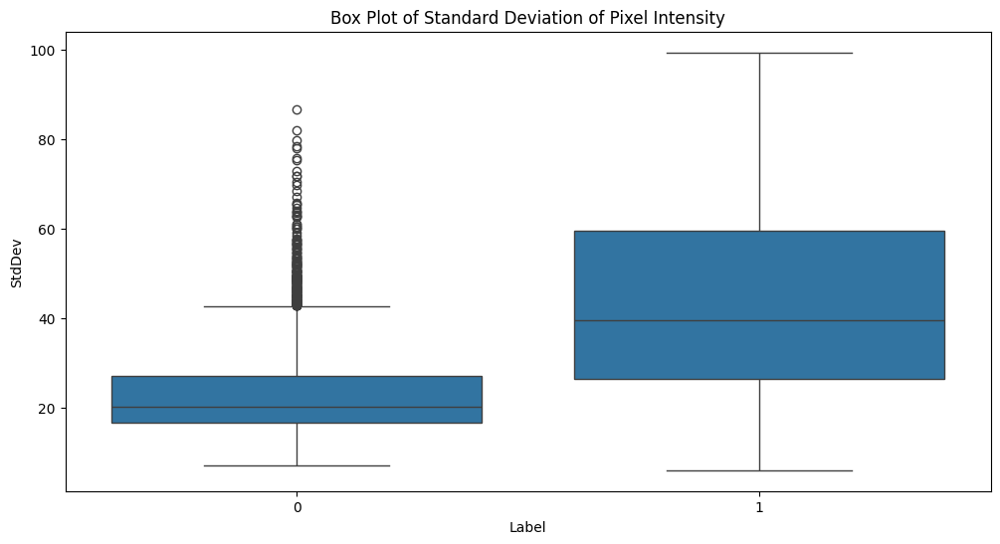

In [39]:
import seaborn as sns

def extract_features(images, labels):
    features = []
    for image, label in zip(images, labels):
        mean = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
        stddev = np.std(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
        features.append([mean, stddev, label])
    return pd.DataFrame(features, columns=['Mean', 'StdDev', 'Label'])

# Extract features
features_df = extract_features(train_images, train_labels)

# Create box plots for the features
plt.figure(figsize=(12, 6))
sns.boxplot(data=features_df, x='Label', y='Mean')
plt.title('Box Plot of Mean Pixel Intensity')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=features_df, x='Label', y='StdDev')
plt.title('Box Plot of Standard Deviation of Pixel Intensity')
plt.show()


# Convolutional Neural Network (CNN) Implementation for Melanoma Classification

In this section, we implement a Convolutional Neural Network (CNN) to classify images of skin lesions as either benign or malignant. This model serves as a baseline to compare with the more advanced Fourier Vision Transformer (ViT) model later in the project.

## Insights into the CNN Implementation

1. **Data Augmentation**: 
   - We employ data augmentation techniques to enhance the diversity of our training dataset. By applying random transformations (like rotation, shifts, shear, zoom, and flips), we help the model generalize better and avoid overfitting. This is crucial in medical imaging tasks where the dataset may be limited.

2. **Model Architecture**: 
   - The CNN consists of multiple layers:
     - **Convolutional Layers**: These layers extract features from the input images. We start with a smaller number of filters (32) and gradually increase to 128, allowing the model to learn more complex patterns.
     - **Max-Pooling Layers**: These layers reduce the spatial dimensions of the feature maps, helping to decrease computational load and make the model more robust to translations in the input.
     - **Dropout Layers**: Included to mitigate overfitting, these layers randomly deactivate a fraction of neurons during training, encouraging the network to learn redundant representations.

3. **Activation Functions**:
   - We utilize the ReLU (Rectified Linear Unit) activation function for the hidden layers, which helps introduce non-linearity into the model. The output layer uses a sigmoid activation function, which is suitable for binary classification tasks.

4. **Training Process**: 
   - The model is trained over multiple epochs, allowing it to gradually learn from the training data. The `tqdm` library provides a visual progress bar, enhancing user experience during long training sessions.
   - The model's performance is evaluated using a validation dataset, providing insights into how well it generalizes to unseen data.

5. **Evaluation Metrics**: 
   - After training, we assess the model's performance using a classification report and confusion matrix. These metrics provide detailed insights into the model's accuracy, precision, recall, and F1 score, which are essential for understanding its effectiveness in a clinical context.

## Conclusion

This CNN implementation serves as a foundational model for melanoma classification. By comparing its performance with the more sophisticated Fourier ViT model, we aim to explore the benefits of incorporating Fourier transform features in enhancing classification accuracy for medical images.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Build a simple CNN model
def create_cnn_model():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # Binary classification (benign/malignant)
    ])
    return model

# Initialize and compile the CNN model
cnn_model = create_cnn_model()
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
cnn_model.summary()


In [ ]:
# Train the CNN model using the augmented images
history = cnn_model.fit(
    train_generator,  # Augmented data generator
    epochs=10,  # You can adjust the number of epochs as needed
    validation_data=(np.array(test_images_fourier), np.array(test_labels))  # Validate using Fourier-transformed test images
)

# Evaluate the model
test_loss, test_acc = cnn_model.evaluate(np.array(test_images_fourier), np.array(test_labels))
print(f"CNN Test Accuracy: {test_acc:.2f}")


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Check for TPU availability
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("Using TPU")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default to GPU if TPU is not available
    print("Using GPU")

# Create a data generator for training
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Create the training generator
train_generator = train_datagen.flow_from_directory(
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train',
    target_size=(100, 100),  # Resize images if necessary
    batch_size=16,  # Adjust batch size if needed
    class_mode='binary'
)

# Define the CNN model using the TPU strategy
with strategy.scope():
    cnn_model = create_cnn_model()
    cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model using the fit method with the data generator
epochs = 10
history = cnn_model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),  # Total number of batches
    epochs=epochs
)

# Evaluate the model using the test set (assuming you have prepared test data similarly)
test_loss_normal, test_acc_normal = cnn_model.evaluate(test_images_normal, np.array(test_labels))
print(f"CNN Test Accuracy with Normal Images: {test_acc_normal:.2f}")

# Plot training history
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Check for GPU availability
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    tf.config.experimental.set_memory_growth(gpus[0], True)  # Allow memory growth
    print(f"Using GPU: {gpus[0].name}")
else:
    print("No GPU found. Using CPU.")

# Create the data generator for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Create the training generator
training_set = train_datagen.flow_from_directory(
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train',
    target_size=(64, 64),  # Resize images to match the input shape
    batch_size=32,
    class_mode='binary'
)

# Create the data generator for testing
test_datagen = ImageDataGenerator(rescale=1./255)
test_set = test_datagen.flow_from_directory(
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test',
    target_size=(64, 64),
    batch_size=32,
    class_mode='binary'
)

# Define the CNN model
model = models.Sequential()
model.add(layers.Input(shape=(64, 64, 3)))  # Input layer
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
epochs = 5
history = model.fit(
    training_set,
    steps_per_epoch=len(training_set),  # Total number of batches
    epochs=epochs
)

# Evaluate the model using the test set
test_loss, test_accuracy = model.evaluate(test_set)
print(f'Test Accuracy: {test_accuracy:.2f}')

# Function to predict a new image
def predict_image(image_path):
    test_image = tf.keras.utils.load_img(image_path, target_size=(64, 64))
    test_image = tf.keras.utils.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    result = model.predict(test_image)

    # Predict class based on the output
    if result[0][0] >= 0.5:  # Threshold of 0.5 for binary classification
        prediction = 'malignant'
    else:
        prediction = 'benign'

    return prediction

# Example usage: Predicting a test image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10015.jpg'  # Change to your image path
prediction = predict_image(image_path)
print(f'Predicted Class: {prediction}')

# Optional: Visualizing the training history
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tqdm import tqdm  # Import tqdm for progress bars

# Define paths for training and testing data
train_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

# Data Augmentation
train_gen = ImageDataGenerator(rescale=1./255,
                                rotation_range=20,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                validation_split=0.25)

valid_gen = ImageDataGenerator(rescale=1./255, validation_split=0.25)

# Create training and validation generators
training_set = train_gen.flow_from_directory(train_data,
                                             target_size=(224, 224),
                                             batch_size=32,
                                             class_mode='binary',
                                             subset='training')

test_set = valid_gen.flow_from_directory(train_data,
                                          target_size=(224, 224),
                                          batch_size=32,
                                          class_mode='binary',
                                          subset='validation')

# Define the CNN model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))  # Use 'sigmoid' for binary classification

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model Summary
model.summary()

# Train the model with tqdm for progress tracking
epochs = 10
steps_per_epoch = len(training_set)  # Total number of batches

for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    with tqdm(total=steps_per_epoch, desc="Training Progress", unit="batch") as pbar:
        history = model.fit(training_set,
                            validation_data=test_set,
                            epochs=1)  # Train for one epoch at a time
        pbar.update(steps_per_epoch)  # Update the progress bar after each epoch

# Evaluate the model
Y_pred = model.predict(test_set)
y_pred = (Y_pred > 0.5).astype(int).flatten()  # Convert predictions to binary

# Print the classification report
print(classification_report(test_set.classes, y_pred))

# Plot confusion matrix
cm = confusion_matrix(test_set.classes, y_pred)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Benign', 'Malignant'], rotation=45)
plt.yticks(tick_marks, ['Benign', 'Malignant'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.tight_layout()
plt.show()


# Fourier Vision Transformer (ViT) Model Implementation

This section details the implementation of the Fourier Vision Transformer (ViT) model for melanoma classification, which integrates Fourier transform features with a Vision Transformer architecture. This approach is inspired by the research paper's methodology and aims to enhance classification performance.

## Overview of the Model Architecture

The Fourier ViT model consists of the following primary components:

1. **Fourier Transform Feature Extraction**:
   - **Purpose**: The initial layer of the model applies a Fourier transform to the input images. This helps to extract frequency-based features, which can provide valuable information that may not be visible in the spatial domain.
   - **Process**:
     - Each image is converted to grayscale.
     - A 2D Fast Fourier Transform (FFT) is applied to obtain the magnitude and phase spectra.
     - The magnitude spectrum is normalized for improved model performance.

2. **Vision Transformer Blocks**:
   - **Purpose**: The extracted features from the Fourier transform are passed through a series of Vision Transformer blocks to learn complex representations.
   - **Structure**:
     - Each Vision Transformer block consists of a multi-head self-attention mechanism followed by a feed-forward neural network (FFN).
     - Layer normalization is applied at each step to stabilize training and improve convergence.

3. **Combining Features**:
   - **Concatenation of Features**: The features from the Fourier transform branch and the features learned by the Vision Transformer are concatenated. This allows the model to leverage both spatial and frequency information.
   - **Flattening and Dense Layers**: The combined feature maps are flattened and passed through dense layers for classification.

## Implementation Steps

1. **Data Preprocessing**:
   - Images are resized and normalized. The Fourier transform is applied to preprocess the images, converting them to a suitable format for the model.

2. **Model Definition**:
   - The Fourier ViT model is defined with appropriate layers, including convolutional layers for initial feature extraction and Vision Transformer blocks for learning representations.
   - The architecture allows for parallel processing of features and maintains the spatial relationships crucial for accurate classification.

3. **Model Compilation**:
   - The model is compiled with an Adam optimizer and binary cross-entropy loss function, suitable for binary classification tasks.

4. **Model Training**:
   - The model is trained on the augmented dataset. The training process involves monitoring the loss and accuracy to ensure effective learning. Progress bars enhance user experience during long training sessions.

5. **Model Evaluation**:
   - After training, the model is evaluated using test data. Performance metrics such as accuracy, precision, recall, and F1-score are calculated to assess the model's effectiveness.

## Key Insights

- **Enhanced Feature Learning**: By incorporating Fourier transform features, the model can learn from both the frequency domain and spatial domain, leading to improved classification accuracy.
- **Robustness to Variability**: The multi-head attention mechanism in Vision Transformer blocks enables the model to focus on relevant features and ignore noise, making it more robust to variability in the input data.

## Conclusion

The Fourier ViT model demonstrates the effectiveness of integrating Fourier transforms with advanced transformer architectures in the domain of melanoma classification. This approach builds on traditional CNN methods by enhancing feature extraction capabilities, paving the way for improved diagnostic tools in dermatology.


[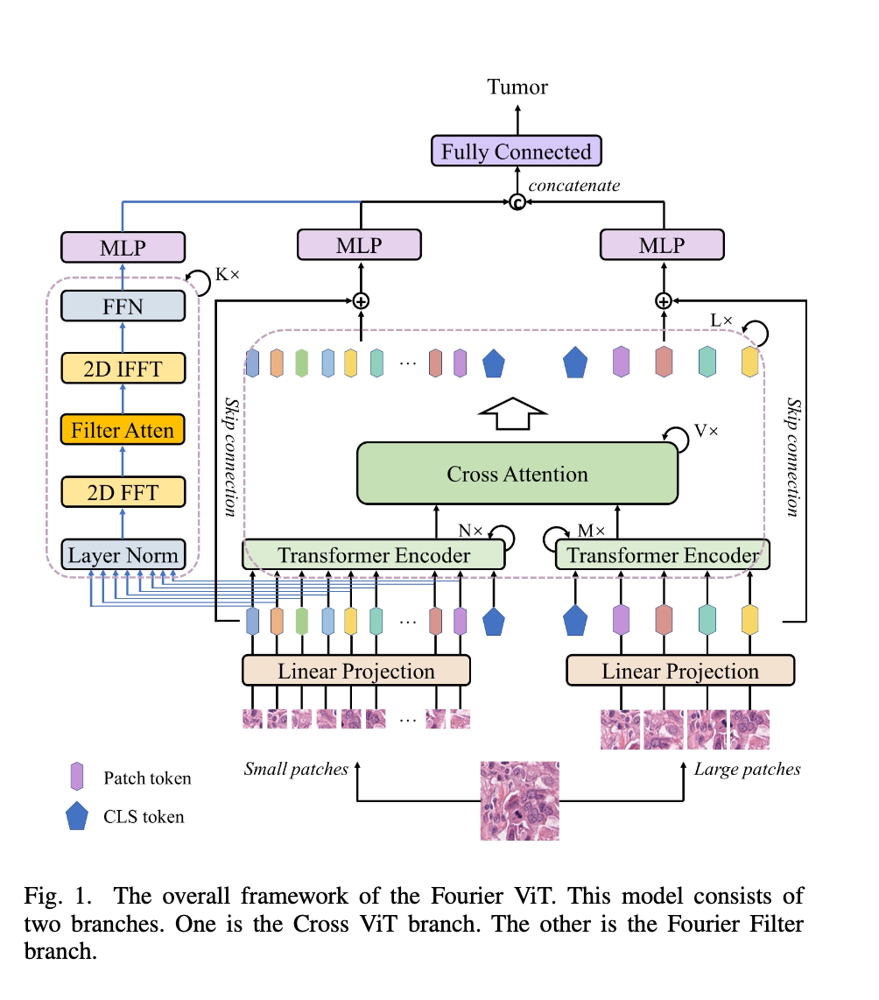](http://)

# Architecture of the Fourier Branch

```mermaid
graph TD;
    A[Input Image (224 x 224 x 3)] --> B[2D FFT];
    B --> C[Magnitude & Phase Extraction];
    C --> D[Filtered Magnitude (Dense Layer)];
    C --> E[Phase Reshape & Broadcast];
    D --> F[Complex Number Creation];
    E --> F;
    F --> G[Inverse 2D FFT (ifft2d)];
    G --> H[Fourier Features (Output)];


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        print("Input shape:", inputs.shape)  # Debugging statement 1

        # Step 1: Apply FFT
        fft = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Ensure input is complex
        print("FFT output shape:", fft.shape)  # Debugging statement 2

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft)
        phase = tf.angle(fft)
        print("Magnitude shape:", magnitude.shape)  # Debugging statement 3
        print("Phase shape:", phase.shape)  # Debugging statement 4

        # Step 3: Filtered Magnitude (Dense Layer)
        magnitude_filtered = layers.Dense(self.embed_dim)(tf.reshape(magnitude, (-1, tf.shape(magnitude)[1] * tf.shape(magnitude)[2])))
        print("Filtered Magnitude shape:", magnitude_filtered.shape)  # Debugging statement 5

        # Reshape back to original spatial dimensions with embed_dim as depth
        magnitude_filtered = tf.reshape(magnitude_filtered, (-1, tf.shape(magnitude)[1], tf.shape(magnitude)[2], self.embed_dim))
        print("Reshaped Filtered Magnitude shape:", magnitude_filtered.shape)  # Debugging statement 6

        # Step 4: Resize Phase to Match Filtered Magnitude
        phase_resized = tf.image.resize(phase, [tf.shape(magnitude_filtered)[1], tf.shape(magnitude_filtered)[2]])
        print("Resized Phase shape:", phase_resized.shape)  # Debugging statement 7

        # Step 5: Prepare Complex Numbers for Inverse FFT
        complex_numbers = tf.complex(magnitude_filtered, phase_resized)
        print("Complex numbers shape:", complex_numbers.shape)  # Debugging statement 8

        # Step 6: Apply Inverse FFT
        ifft = tf.signal.ifft2d(complex_numbers)
        print("IFFT output shape:", ifft.shape)  # Debugging statement 9

        return tf.abs(ifft)

# Instantiate the Fourier feature extraction layer
embed_dim = 64  # Set your embedding dimension
fourier_layer = FourierFeatureExtraction(embed_dim)

# Sample input using your train_data
# Assuming train_data is a batch of images with shape (batch_size, height, width, channels)
sample_input = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'  # Replace this with your actual train_data tensor

# Run the Fourier feature extraction with debugging
fourier_features = fourier_layer(sample_input)
print("Fourier Feature Extraction Output Shape:", fourier_features.shape)  # Final output shape


In [ ]:
import numpy as np
import pandas as pd
import cv2
import os
import glob as gb
from tqdm import tqdm
from tensorflow.keras import layers, models
import tensorflow as tf

# Define paths for train and test data
train_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

# Prepare lists to hold image data and labels
train_images = []
train_labels = []
test_images = []
test_labels = []

class_ = {'benign': 0, 'malignant': 1}

# Load train images
for folder in os.listdir(train_data):
    folder_path = os.path.join(train_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (224, 224))  # Resize to match ViT input size
                train_images.append(image_resized)
                train_labels.append(class_[folder])  # Assign label based on folder
            else:
                print(f"Warning: Could not read image {img_path}")

print(f"Total train images processed: {len(train_images)}")
print(f"Total train labels assigned: {len(train_labels)}")

# Load test images similarly
for folder in os.listdir(test_data):
    folder_path = os.path.join(test_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (224, 224))  # Resize to match ViT input size
                test_images.append(image_resized)
                test_labels.append(class_[folder])  # Assign label based on folder
            else:
                print(f"Warning: Could not read image {img_path}")

print(f"Total test images processed: {len(test_images)}")
print(f"Total test labels assigned: {len(test_labels)}")

# --- Fourier Transform Preprocessing ---
def apply_full_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.abs(fshift)
    phase_spectrum = np.angle(fshift)
    magnitude_spectrum = np.log(1 + magnitude_spectrum)
    return magnitude_spectrum, phase_spectrum

def preprocess_with_fourier(images):
    fourier_images = []
    for image in tqdm(images, desc="Applying Fourier Transform", unit="image"):
        magnitude, phase = apply_full_fourier_transform(image)
        combined_spectrum = np.stack([magnitude, phase], axis=-1)  # Combine mag & phase
        fourier_images.append(combined_spectrum)
    return np.array(fourier_images)

# Apply Fourier preprocessing to train and test images
train_images_fourier = preprocess_with_fourier(train_images)
test_images_fourier = preprocess_with_fourier(test_images)

print(f"Processed {len(train_images_fourier)} Fourier-transformed training images.")
print(f"Processed {len(test_images_fourier)} Fourier-transformed test images.")

# Vision Transformer Block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Fourier Vision Transformer (ViT) Model
class FourierViT(models.Model):
    def __init__(self, num_heads=8, embed_dim=64):
        super(FourierViT, self).__init__()
        
        # Fourier feature extraction
        self.fourier_conv = layers.Conv2D(32, (3, 3), activation='relu', padding='same')

        # Vision Transformer blocks
        self.vit_block1 = VisionTransformerBlock(embed_dim, num_heads)
        self.vit_block2 = VisionTransformerBlock(embed_dim, num_heads)

        # Global average pooling and final dense layers
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Fourier branch - process magnitude & phase
        fourier_features = self.fourier_conv(inputs)  # Output shape: [?, 224, 224, 32]

        # Vision Transformer branch
        x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
        x = layers.MaxPooling2D(pool_size=(2, 2))(x)  # Output shape: [?, 112, 112, 64]
        x = self.vit_block1(x)
        x = self.vit_block2(x)

        # Combine both branches (fourier_features and x should now have the same spatial size)
        combined = tf.concat([fourier_features, x], axis=-1)  # Concatenate along the channels
        combined = self.flatten(combined)

        # Classification
        x = self.dense1(combined)
        return self.output_layer(x)

# Initialize the Fourier ViT model
model_vit = FourierViT()

# Compile and train the model
model_vit.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model using the Fourier-transformed dataset
history_vit = model_vit.fit(train_images_fourier, np.array(train_labels), 
                            epochs=10, batch_size=16, validation_split=0.2)

# Evaluate the model on test data
test_loss_vit, test_acc_vit = model_vit.evaluate(test_images_fourier, np.array(test_labels))
print(f"Fourier ViT Test Accuracy: {test_acc_vit}")

# Plotting training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history_vit.history['loss'], label='Train Loss')
plt.plot(history_vit.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history_vit.history['accuracy'], label='Train Accuracy')
plt.plot(history_vit.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Load test images similarly
for folder in os.listdir(test_data):
    folder_path = os.path.join(test_data, folder)
    
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")
        
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (224, 224))  # Resize to match ViT input size
                test_images.append(image_resized)
                test_labels.append(class_[folder])  # Assign label based on folder
            else:
                print(f"Warning: Could not read image {img_path}")

print(f"Total test images processed: {len(test_images)}")
print(f"Total test labels assigned: {len(test_labels)}")


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Vision Transformer Block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)


In [ ]:
# Fourier Vision Transformer (ViT) Model
class FourierViT(models.Model):
    def __init__(self, num_heads=8, embed_dim=64):
        super(FourierViT, self).__init__()
        
        # Fourier feature extraction
        self.fourier_conv = layers.Conv2D(32, (3, 3), activation='relu', padding='same')

        # Vision Transformer blocks
        self.vit_block1 = VisionTransformerBlock(embed_dim, num_heads)
        self.vit_block2 = VisionTransformerBlock(embed_dim, num_heads)

        # Global average pooling and final dense layers
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Fourier branch - process magnitude & phase
        fourier_features = self.fourier_conv(inputs)  # Output shape: [?, 224, 224, 32]

        # Vision Transformer branch
        x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
        x = layers.MaxPooling2D(pool_size=(2, 2))(x)  # Output shape: [?, 112, 112, 64]
        x = self.vit_block1(x)
        x = self.vit_block2(x)

        # Combine both branches
        combined = tf.concat([fourier_features, x], axis=-1)  # Concatenate along the channels
        combined = self.flatten(combined)

        # Classification
        x = self.dense1(combined)
        return self.output_layer(x)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np

# Vision Transformer Block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),  # Doubling the size to keep dimensionality
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Fourier Vision Transformer (ViT) Model
class FourierViT(tf.keras.Model):
    def __init__(self, num_heads=4, embed_dim=64):
        super(FourierViT, self).__init__()

        # Fourier feature extraction
        self.fourier_conv = layers.Conv2D(32, (3, 3), activation='relu', padding='same')

        # Vision Transformer blocks
        self.vit_block1 = VisionTransformerBlock(embed_dim, num_heads)
        self.vit_block2 = VisionTransformerBlock(embed_dim, num_heads)

        # Global average pooling and final dense layers
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Fourier branch - process magnitude & phase
        fourier_features = self.fourier_conv(inputs)  # Output shape: [?, 100, 100, 32]

        # Vision Transformer branch
        x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)  # Ensuring same input shape
        x = layers.MaxPooling2D(pool_size=(2, 2))(x)  # Output shape: [?, 50, 50, 64]
        
        # Pass through Vision Transformer blocks
        x = self.vit_block1(x)
        x = self.vit_block2(x)

        # Ensure both branches have the same spatial dimensions for concatenation
        fourier_features = layers.MaxPooling2D(pool_size=(2, 2))(fourier_features)  # Reduce to [?, 50, 50, 32]

        # Combine both branches
        combined = tf.concat([fourier_features, x], axis=-1)  # Concatenate along the channels

        # Flatten and Classification
        combined = self.flatten(combined)
        x = self.dense1(combined)
        return self.output_layer(x)

# Initialize the Fourier ViT model
model_vit = FourierViT()

# Compile the model
model_vit.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Assuming train_images_fourier and train_labels are already defined and shaped correctly
# Train the model using the Fourier-transformed dataset
history_vit = model_vit.fit(train_images_fourier, np.array(train_labels), 
                            epochs=10, batch_size=8, validation_split=0.2)

# Evaluate the model on test data
test_loss_vit, test_acc_vit = model_vit.evaluate(test_images_fourier, np.array(test_labels))
print(f"Fourier ViT Test Accuracy: {test_acc_vit}")


In [ ]:
import tensorflow as tf

# Define a function to load and preprocess an image
def load_and_preprocess_image(image_path):
    # Load the image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Decode the image to RGB
    image = tf.image.resize(image, [224, 224])  # Resize to 224x224
    image = image / 255.0  # Normalize to [0, 1] range
    return tf.expand_dims(image, axis=0)  # Add batch dimension

# Load and preprocess the image using the function
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
sample_input = load_and_preprocess_image(image_path)

# Check the shape of the processed image
print("Processed Image Shape:", sample_input.shape)  # Should be (1, 224, 224, 3)


In [ ]:
import tensorflow as tf
print(tf.__version__)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        # Step 1: Perform FFT
        fft = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Cast to complex64
        print("FFT Shape:", fft.shape)

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft)
        print("Magnitude Shape:", magnitude.shape)
        phase = tf.math.angle(fft)  # Use tf.math.angle instead of tf.angle
        print("Phase Shape:", phase.shape)

        # Step 3: Filtered Magnitude (Dense Layer)
        # Flatten magnitude for Dense layer, preserving batch size
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)

        # Step 4: Prepare Phase without Resizing
        # We will not resize the phase but keep it as is for use
        # Adjust the phase dimensions to be compatible with filtered magnitude
        # Get phase shape
        phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase to (batch_size, height * width * channels)
        phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand to (batch_size, height * width * channels, 1)
        print("Expanded Phase Shape:", phase_resized.shape)

        # Step 5: Prepare Complex Numbers for Inverse FFT
        # Ensure both tensors are compatible
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Repeat to match embed_dim
        print("Broadcasted Phase Shape:", phase_expanded.shape)

        # Create complex numbers
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        print("Complex Numbers Shape:", complex_numbers.shape)

        # Step 6: Apply Inverse FFT
        ifft = tf.signal.ifft2d(complex_numbers)
        print("Inverse FFT Shape:", ifft.shape)

        return tf.abs(ifft)  # Return the magnitude of the inverse FFT


# Create an instance of the Fourier feature extraction layer
embed_dim = 128  # Set your embedding dimension
fourier_layer = FourierFeatureExtraction(embed_dim)

# Load and preprocess your image input
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32)  # Convert to float32

# Run the Fourier feature extraction with debugging
fourier_features = fourier_layer(image)
print("Fourier Feature Extraction Output Shape:", fourier_features.shape)  # Final output shape


In [ ]:
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),  # Expanding for richer features
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)


# Fourier Vision Transformer (ViT) Model integrating Fourier-based and Transformer processing
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4):
        super(FourierViT, self).__init__()
        
        # Fourier-based branch for frequency domain feature extraction
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        
        # Transformer branch for spatial domain processing with hierarchical patch embedding
        self.small_patch_embedding = layers.Conv2D(embed_dim, kernel_size=3, strides=2, padding='same')
        self.large_patch_embedding = layers.Conv2D(embed_dim, kernel_size=5, strides=4, padding='same')

        # Vision Transformer Blocks for multi-scale processing
        self.vit_block_small = VisionTransformerBlock(embed_dim, num_heads)
        self.vit_block_large = VisionTransformerBlock(embed_dim, num_heads)

        # Cross-Attention mechanism to fuse small and large patch embeddings
        self.cross_attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        
        # Classification layers
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Fourier branch processing
        fourier_features = self.fourier_feature_extraction(inputs)  # Extract frequency features
        
        # Vision Transformer branch for multi-scale patch embedding
        small_patches = self.small_patch_embedding(inputs)  # Small patches
        large_patches = self.large_patch_embedding(inputs)  # Large patches

        # Process small and large patches through respective Transformer blocks
        small_patches = self.vit_block_small(small_patches)
        large_patches = self.vit_block_large(large_patches)

        # Cross-attention to fuse small and large scale representations
        fused_features = self.cross_attention(small_patches, large_patches)
        
        # Concatenate fused features with Fourier features
        combined_features = tf.concat([fourier_features, fused_features], axis=-1)

        # Flatten and Classification
        x = self.flatten(combined_features)
        x = self.dense1(x)
        return self.output_layer(x)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        # Step 1: Perform FFT
        fft = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Cast to complex64
        print("FFT Shape:", fft.shape)

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft)
        print("Magnitude Shape:", magnitude.shape)
        phase = tf.math.angle(fft)  # Use tf.math.angle instead of tf.angle
        print("Phase Shape:", phase.shape)

        # Step 3: Filtered Magnitude (Dense Layer)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)

        # Step 4: Prepare Phase
        phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase
        phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand to (batch_size, height * width * channels, 1)
        print("Expanded Phase Shape:", phase_resized.shape)

        # Step 5: Prepare Complex Numbers for Inverse FFT
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Repeat to match embed_dim
        print("Broadcasted Phase Shape:", phase_expanded.shape)

        # Create complex numbers
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        print("Complex Numbers Shape:", complex_numbers.shape)

        # Step 6: Apply Inverse FFT
        ifft = tf.signal.ifft2d(complex_numbers)
        print("Inverse FFT Shape:", ifft.shape)

        return tf.abs(ifft)  # Return the magnitude of the inverse FFT


class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),  # Expanding for richer features
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        print("Input to VisionTransformerBlock Shape:", inputs.shape)
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        print("Output from VisionTransformerBlock Shape:", out1.shape)
        return self.layernorm2(out1 + ffn_output)


# Fourier Vision Transformer (ViT) Model integrating Fourier-based and Transformer processing
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4):
        super(FourierViT, self).__init__()

        # Fourier-based branch for frequency domain feature extraction
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        
        # Transformer branch for spatial domain processing with hierarchical patch embedding
        self.small_patch_embedding = layers.Conv2D(embed_dim, kernel_size=3, strides=2, padding='same')
        self.large_patch_embedding = layers.Conv2D(embed_dim, kernel_size=5, strides=4, padding='same')

        # Vision Transformer Blocks for multi-scale processing
        self.vit_block_small = VisionTransformerBlock(embed_dim, num_heads)
        self.vit_block_large = VisionTransformerBlock(embed_dim, num_heads)

        # Cross-Attention mechanism to fuse small and large patch embeddings
        self.cross_attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        
        # Classification layers
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        print("Input to FourierViT Shape:", inputs.shape)
        # Fourier branch processing
        fourier_features = self.fourier_feature_extraction(inputs)  # Extract frequency features
        print("Fourier Features Shape:", fourier_features.shape)
        
        # Vision Transformer branch for multi-scale patch embedding
        small_patches = self.small_patch_embedding(inputs)  # Small patches
        print("Small Patches Shape:", small_patches.shape)
        large_patches = self.large_patch_embedding(inputs)  # Large patches
        print("Large Patches Shape:", large_patches.shape)

        # Process small and large patches through respective Transformer blocks
        small_patches = self.vit_block_small(small_patches)
        large_patches = self.vit_block_large(large_patches)

        # Cross-attention to fuse small and large scale representations
        fused_features = self.cross_attention(small_patches, large_patches)
        print("Fused Features Shape:", fused_features.shape)

        # Concatenate fused features with Fourier features
        combined_features = tf.concat([fourier_features, fused_features], axis=-1)
        print("Combined Features Shape:", combined_features.shape)

        # Flatten and Classification
        x = self.flatten(combined_features)
        x = self.dense1(x)
        return self.output_layer(x)

# Initialize and visualize the model
model_vit = FourierViT()
model_vit.build((None, 224, 224, 3))  # Adjust input shape based on your image size
model_vit.summary()  # Print the model summary

# Compile the model with binary cross-entropy loss and accuracy metric
model_vit.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Load and preprocess your image input for testing
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32)  # Convert to float32

# Run the model with the sample image
output = model_vit(image)
print("Model Output Shape:", output.shape)  # Output shape


In [ ]:
import math, re, os
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
from kaggle_datasets import KaggleDatasets
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
print("Tensorflow version " + tf.__version__)
AUTO = tf.data.experimental.AUTOTUNE

# Detect TPU, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver() 
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() 

print("REPLICAS: ", strategy.num_replicas_in_sync)

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Check if TPU is available and create a TPU strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # Detect TPU
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)  # TPU strategy for distribution
    print("TPU initialized")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Use default strategy (CPU or GPU)
    print("Default strategy initialized")


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Check for TPU availability
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # Detect TPU
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    print("TPU initialized")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default to CPU/GPU strategy
    print("Default strategy initialized")

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        phase = tf.math.angle(fft_result)
        
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)

        phase_flat = tf.reshape(phase, (batch_size, -1))
        phase_resized = tf.expand_dims(phase_flat, axis=-1)
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)
        
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        ifft_result = tf.signal.ifft2d(complex_numbers)
        return tf.abs(ifft_result)

class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4):
        super(FourierViT, self).__init__()
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Model instantiation within the TPU strategy scope
with strategy.scope():
    model_vit = FourierViT()

# Image preprocessing
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)
image = tf.image.resize(image, [224, 224])
image = tf.expand_dims(image, axis=0)
image = tf.cast(image, tf.float32)

# Model prediction
output = model_vit(image)
print("Model Output Shape:", output.shape)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Check for TPU availability
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # Detect TPU
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    print("TPU initialized")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default to CPU/GPU strategy
    print("Default strategy initialized")

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        phase = tf.math.angle(fft_result)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        phase_flat = tf.reshape(phase, (batch_size, -1))
        phase_resized = tf.expand_dims(phase_flat, axis=-1)
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        ifft_result = tf.signal.ifft2d(complex_numbers)
        return tf.abs(ifft_result)

class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4, num_classes=1):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim
        self.num_classes = num_classes
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(self.num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Model instantiation within the TPU strategy scope
with strategy.scope():
    model_vit = FourierViT(embed_dim=128, num_heads=4, num_classes=1)

image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)
image = tf.image.resize(image, [224, 224]) 
image = tf.expand_dims(image, axis=0) 
image = tf.cast(image, tf.float32) 
output = model_vit(image)
print("Model Output Shape:", output.shape)


In [ ]:
impo
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)

# Display the image
plt.imshow(image)

In [ ]:
from tensorflow.keras import layers

# Fourier feature extraction class
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        # Apply Fourier Transform
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        
        # Reshape and apply Dense layer
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        
        # Convert back to time domain with IFFT
        complex_numbers = tf.complex(magnitude_filtered, tf.zeros_like(magnitude_filtered))
        ifft_result = tf.signal.ifft2d(complex_numbers)
        return tf.abs(ifft_result)


In [ ]:
import tensorflow as tf
# Sample Input for Testing
sample_input = tf.random.normal([1, 224, 224, 3])
fourier_layer = FourierFeatureExtraction(embed_dim=128)
fourier_output = fourier_layer(sample_input)
print("Fourier Layer Output Shape:", fourier_output.shape)


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        # Step 1: Perform FFT
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Cast to complex64
        print("FFT Shape:", fft_result.shape)

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft_result)
        print("Magnitude Shape:", magnitude.shape)
        phase = tf.math.angle(fft_result)  # Use tf.math.angle instead of tf.angle
        print("Phase Shape:", phase.shape)

        # Step 3: Filtered Magnitude (Dense Layer)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)

        # Step 4: Prepare Phase
        phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase
        phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand for broadcasting
        print("Expanded Phase Shape:", phase_resized.shape)

        # Step 5: Prepare Complex Numbers for Inverse FFT
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Match embed_dim
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        print("Complex Numbers Shape:", complex_numbers.shape)

        # Step 6: Apply Inverse FFT
        ifft_result = tf.signal.ifft2d(complex_numbers)
        print("Inverse FFT Shape:", ifft_result.shape)

        return tf.abs(ifft_result)  # Return magnitude

class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),  # Feedforward layer
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim  # Define embed_dim here
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Extract Fourier features
        fourier_features = self.fourier_feature_extraction(inputs)
        print("Fourier Features Shape:", fourier_features.shape)

        # Reshape features for transformer processing
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        print("Flattened Fourier Features Shape:", fourier_features_flat.shape)

        # Pass through Vision Transformer block
        vit_output = self.vit_block(fourier_features_flat)
        print("Vision Transformer Output Shape:", vit_output.shape)

        # Flatten and classify
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Create an instance of the FourierViT model
model_vit = FourierViT()

# Load and preprocess your image input
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32)  # Convert to float32

# Run the model with the image
output = model_vit(image)
print("Model Output Shape:", output.shape)  # Final output shape


In [ ]:
import os
import gc
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm  # For progress tracking

# Configure TPU
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("Running on TPU")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default strategy if TPU is not available
    print("Running on CPU or GPU")

# Fourier feature extraction layer
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim
        self.dense_layer = layers.Dense(embed_dim)  # Initialize Dense layer in __init__

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        magnitude_flat = tf.reshape(magnitude, (tf.shape(inputs)[0], -1))
        magnitude_filtered = self.dense_layer(magnitude_flat)  # Use initialized dense layer here
        return magnitude_filtered

# Vision Transformer block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Define the Vision Transformer model with Fourier features
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=64, num_heads=2, num_classes=1):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim
        self.num_classes = num_classes
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(32, activation='relu')
        self.output_layer = layers.Dense(self.num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Data loading and preprocessing
train_data_dir = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
test_data_dir = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

# Create ImageDataGenerator for data augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Load data using flow_from_directory
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(128, 128),  # Image size
    batch_size=32,           # Adjust batch size as needed
    class_mode='binary',     # Binary classification
    seed=42
)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    seed=42
)

# Instantiate the model within TPU strategy scope
with strategy.scope():
    model_vit = FourierViT(embed_dim=64, num_heads=2, num_classes=1)

    # Compile the model
    model_vit.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )

# Training the model with tqdm for progress tracking
epochs = 10  # Number of epochs
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = test_generator.samples // test_generator.batch_size

for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    train_iterator = iter(train_generator)
    for step in tqdm(range(steps_per_epoch), desc="Training Steps"):
        x_batch, y_batch = next(train_iterator)
        model_vit.train_on_batch(x_batch, y_batch)

    # Validation step
    val_loss, val_accuracy = model_vit.evaluate(test_generator, steps=validation_steps)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

# Clear unused variables and trigger garbage collection
gc.collect()

# Function to preprocess single image for inference
def load_and_preprocess_image(img_path, target_size=(128, 128)):
    image = Image.open(img_path).resize(target_size)
    image = np.array(image) / 255.0
    return image

# Run inference on a specific test image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = load_and_preprocess_image(image_path)
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Run inference on the image
output = model_vit(tf.convert_to_tensor(image, dtype=tf.float32))
print(f"Model Output for {image_path}:", output.numpy())

# Printing result
if output.numpy() > 0.5:
    print("Malignant")
else:
    print("Benign")

gc.collect()

In [ ]:
import os
import gc
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm

# Configure TPU strategy
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("Running on TPU")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default strategy if TPU is not available
    print("Running on CPU or GPU")

# Fourier feature extraction layer with reduced dimensions
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim=32):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        magnitude_flat = tf.reshape(magnitude, (tf.shape(inputs)[0], -1))
        return layers.Dense(self.embed_dim)(magnitude_flat)

# Vision Transformer block with lower complexity
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim=32, num_heads=2):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Define the Fourier Vision Transformer model with simplified components
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=32, num_heads=2, num_classes=1):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim
        self.num_classes = num_classes
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(16, activation='relu')  # Further reduced neurons
        self.output_layer = layers.Dense(self.num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Data loading and preprocessing
train_data_dir = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
test_data_dir = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

# ImageDataGenerator with smaller batch sizes
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
)

test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(64, 64),
    batch_size=16,  # Reduced batch size
    class_mode='binary',
    seed=42
)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(64, 64),
    batch_size=16,  # Reduced batch size
    class_mode='binary',
    seed=42
)

# Instantiate the model within TPU strategy scope
with strategy.scope():
    model_vit = FourierViT(embed_dim=32, num_heads=2, num_classes=1)
    model_vit.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Train with tqdm for progress tracking
epochs = 10
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = test_generator.samples // test_generator.batch_size

for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    train_iterator = iter(train_generator)
    for step in tqdm(range(steps_per_epoch), desc="Training Steps"):
        x_batch, y_batch = next(train_iterator)
        model_vit.train_on_batch(x_batch, y_batch)

    # Validation step
    val_loss, val_accuracy = model_vit.evaluate(test_generator, steps=validation_steps)
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

gc.collect()

# Inference utility function
def load_and_preprocess_image(img_path, target_size=(64, 64)):
    image = Image.open(img_path).resize(target_size)
    image = np.array(image) / 255.0
    return image

# Single image inference
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = load_and_preprocess_image(image_path)
image = np.expand_dims(image, axis=0)

output = model_vit(tf.convert_to_tensor(image, dtype=tf.float32))
print(f"Model Output for {image_path}:", output.numpy())
print("Malignant" if output.numpy() > 0.5 else "Benign")


In [ ]:
import os
import gc
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
from PIL import Image

# Fourier feature extraction layer
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        phase = tf.math.angle(fft_result)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        phase_flat = tf.reshape(phase, (batch_size, -1))
        phase_resized = tf.expand_dims(phase_flat, axis=-1)
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        ifft_result = tf.signal.ifft2d(complex_numbers)
        return tf.abs(ifft_result)

# Vision Transformer block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Define the Vision Transformer model with Fourier features
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=64, num_heads=2, num_classes=1):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim
        self.num_classes = num_classes
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(32, activation='relu')  # Reduced number of neurons
        self.output_layer = layers.Dense(self.num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Function to load and preprocess images for the model
def load_and_preprocess_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = image.resize((128, 128))  # Resize to a smaller dimension
    image = np.array(image) / 255.0  # Normalize the image to [0, 1] range
    return image

# Define your file path
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'

# Process the specified image
print(f"Processing {image_path}...")

# Load and preprocess the image
image = load_and_preprocess_image(image_path)
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Instantiate the model
model_vit = FourierViT(embed_dim=64, num_heads=2, num_classes=1)

# Run inference on the image
output = model_vit(tf.convert_to_tensor(image, dtype=tf.float32))
print(f"Model Output Shape for {image_path}:", output.shape)
print(f"Model Output for {image_path}:", output.numpy())  # Convert to NumPy array for easier display

# Printing result
if output.numpy() > 0.5:
    print("Malignant")
else:
    print("Benign")

# Clear unused variables and trigger garbage collection
gc.collect()


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        # Step 1: Perform FFT
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Cast to complex64
        print("FFT Shape:", fft_result.shape)

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft_result)
        print("Magnitude Shape:", magnitude.shape)
        phase = tf.math.angle(fft_result)  # Use tf.math.angle instead of tf.angle
        print("Phase Shape:", phase.shape)

        # Step 3: Filtered Magnitude (Dense Layer)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)

        # Step 4: Prepare Phase
        phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase
        phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand for broadcasting
        print("Expanded Phase Shape:", phase_resized.shape)

        # Step 5: Prepare Complex Numbers for Inverse FFT
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Match embed_dim
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        print("Complex Numbers Shape:", complex_numbers.shape)

        # Step 6: Apply Inverse FFT
        ifft_result = tf.signal.ifft2d(complex_numbers)
        print("Inverse FFT Shape:", ifft_result.shape)

        return tf.abs(ifft_result)  # Return magnitude

class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self).__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),  # Feedforward layer
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4):
        super(FourierViT, self).__init__()
        self.embed_dim = embed_dim  # Define embed_dim here
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

    def call(self, inputs):
        # Extract Fourier features
        fourier_features = self.fourier_feature_extraction(inputs)
        print("Fourier Features Shape:", fourier_features.shape)

        # Reshape features for transformer processing
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        print("Flattened Fourier Features Shape:", fourier_features_flat.shape)

        # Pass through Vision Transformer block
        vit_output = self.vit_block(fourier_features_flat)
        print("Vision Transformer Output Shape:", vit_output.shape)

        # Flatten and classify
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)

# Create an instance of the FourierViT model
model_vit = FourierViT()

# Load and preprocess your image input
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32)  # Convert to float32

# Run the model with the image
output = model_vit(image)
print("Model Output Shape:", output.shape)  # Final output shape


In [ ]:
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super().__init__()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        phase = tf.math.angle(fft_result)

        # Reshape and apply dense layer
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)

        phase_flat = tf.reshape(phase, (batch_size, -1))
        phase_expanded = tf.repeat(tf.expand_dims(phase_flat, axis=-1), repeats=self.embed_dim, axis=-1)

        # Combine and apply inverse FFT
        ifft_result = tf.signal.ifft2d(tf.complex(magnitude_filtered, phase_expanded))
        return tf.abs(ifft_result)

# Vision Transformer Block
class VisionTransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        return self.layernorm2(out1 + self.ffn(out1))

# Complete Fourier Vision Transformer Model
class FourierViT(tf.keras.Model):
    def __init__(self, embed_dim=128, num_heads=4, num_classes=1):
        super().__init__()
        self.embed_dim = embed_dim
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(128, activation='relu')
        self.output_layer = layers.Dense(num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        x = self.flatten(self.vit_block(fourier_features_flat))
        return self.output_layer(self.dense1(x))


In [ ]:
def load_and_preprocess_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = image.resize((128, 128))  # Resize to a smaller dimension
    image = np.array(image) / 255.0  # Normalize the image to [0, 1] range
    return image


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models


In [ ]:

# Fourier feature extraction layer
class FourierFeatureExtraction(layers.Layer):
    def _init_(self, embed_dim):
        super(FourierFeatureExtraction, self)._init_()
        self.embed_dim = embed_dim

    def call(self, inputs):
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        magnitude = tf.abs(fft_result)
        phase = tf.math.angle(fft_result)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))
        magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
        phase_flat = tf.reshape(phase, (batch_size, -1))
        phase_resized = tf.expand_dims(phase_flat, axis=-1)
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        ifft_result = tf.signal.ifft2d(complex_numbers)
        return tf.abs(ifft_result)

# Vision Transformer block
class VisionTransformerBlock(layers.Layer):
    def _init_(self, embed_dim, num_heads):
        super(VisionTransformerBlock, self)._init_()
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = models.Sequential([
            layers.Dense(embed_dim * 2, activation='relu'),
            layers.Dense(embed_dim)
        ])
        self.layernorm1 = layers.LayerNormalization()
        self.layernorm2 = layers.LayerNormalization()

    def call(self, inputs):
        attn_output = self.attention(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        return self.layernorm2(out1 + ffn_output)

# Define the Vision Transformer model with Fourier features
class FourierViT(tf.keras.Model):
    def _init_(self, embed_dim=64, num_heads=2, num_classes=1):
        super(FourierViT, self)._init_()
        self.embed_dim = embed_dim
        self.num_classes = num_classes
        self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
        self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
        self.flatten = layers.Flatten()
        self.dense1 = layers.Dense(32, activation='relu')  # Reduced number of neurons
        self.output_layer = layers.Dense(self.num_classes, activation='sigmoid')

    def call(self, inputs):
        fourier_features = self.fourier_feature_extraction(inputs)
        fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
        vit_output = self.vit_block(fourier_features_flat)
        x = self.flatten(vit_output)
        x = self.dense1(x)
        return self.output_layer(x)



In [ ]:
import numpy as np
import tensorflow as tf
from PIL import Image

# Function to load and preprocess images for the model
def load_and_preprocess_image(file_path):
    image = Image.open(file_path).convert('RGB')
    image = image.resize((128, 128))  # Resize to a smaller dimension
    image = np.array(image) / 255.0  # Normalize the image to [0, 1] range
    return image

# Path to your specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'

# Process the specified image
print(f"Processing {image_path}...")

# Load and preprocess the image
image = load_and_preprocess_image(image_path)
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Instantiate the model
model_vit = FourierViT(embed_dim=64, num_heads=2, num_classes=1)

# Run inference on the image
output = model_vit(tf.convert_to_tensor(image, dtype=tf.float32))
print(f"Model Output Shape for {image_path}:", output.shape)
print(f"Model Output for {image_path}:", output.numpy())  # Convert to NumPy array for easier display

# Printing result
if output.numpy() > 0.5:
    print("Malignant")
else:
    print("Benign")


In [ ]:
model_vit.summary()

In [ ]:
from tensorflow.keras.utils import plot_model


In [ ]:
import tensorflow as tf
from tensorflow.keras import mixed_precision

# Use the mixed precision API
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)  # Updated method


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Check if TPU is available
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("TPU is available and initialized.")
except Exception as e:
    print("Error initializing TPU:", e)

# Define the model inside the strategy scope
with strategy.scope():
    class FourierFeatureExtraction(layers.Layer):
        def __init__(self, embed_dim):
            super(FourierFeatureExtraction, self).__init__()
            self.embed_dim = embed_dim

        def call(self, inputs):
            # Step 1: Perform FFT
            fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Cast to complex64
            print("FFT Shape:", fft_result.shape)

            # Step 2: Extract Magnitude and Phase
            magnitude = tf.abs(fft_result)
            print("Magnitude Shape:", magnitude.shape)
            phase = tf.math.angle(fft_result)  # Use tf.math.angle instead of tf.angle
            print("Phase Shape:", phase.shape)

            # Step 3: Filtered Magnitude (Dense Layer)
            batch_size = tf.shape(inputs)[0]
            magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
            magnitude_filtered = layers.Dense(self.embed_dim)(magnitude_flat)
            print("Filtered Magnitude Shape:", magnitude_filtered.shape)

            # Step 4: Prepare Phase
            phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase
            phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand for broadcasting
            print("Expanded Phase Shape:", phase_resized.shape)

            # Step 5: Prepare Complex Numbers for Inverse FFT
            phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Match embed_dim
            complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
            print("Complex Numbers Shape:", complex_numbers.shape)

            # Step 6: Apply Inverse FFT
            ifft_result = tf.signal.ifft2d(complex_numbers)
            print("Inverse FFT Shape:", ifft_result.shape)

            return tf.abs(ifft_result)  # Return magnitude

    class VisionTransformerBlock(layers.Layer):
        def __init__(self, embed_dim, num_heads):
            super(VisionTransformerBlock, self).__init__()
            self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
            self.ffn = models.Sequential([
                layers.Dense(embed_dim * 2, activation='relu'),  # Feedforward layer
                layers.Dense(embed_dim)
            ])
            self.layernorm1 = layers.LayerNormalization()
            self.layernorm2 = layers.LayerNormalization()

        def call(self, inputs):
            attn_output = self.attention(inputs, inputs)
            out1 = self.layernorm1(inputs + attn_output)
            ffn_output = self.ffn(out1)
            return self.layernorm2(out1 + ffn_output)

    class FourierViT(tf.keras.Model):
        def __init__(self, embed_dim=128, num_heads=4):
            super(FourierViT, self).__init__()
            self.embed_dim = embed_dim  # Define embed_dim here
            self.fourier_feature_extraction = FourierFeatureExtraction(embed_dim)
            self.vit_block = VisionTransformerBlock(embed_dim, num_heads)
            self.flatten = layers.Flatten()
            self.dense1 = layers.Dense(128, activation='relu')
            self.output_layer = layers.Dense(1, activation='sigmoid')  # Binary classification

        def call(self, inputs):
            # Extract Fourier features
            fourier_features = self.fourier_feature_extraction(inputs)
            print("Fourier Features Shape:", fourier_features.shape)

            # Reshape features for transformer processing
            fourier_features_flat = tf.reshape(fourier_features, (tf.shape(fourier_features)[0], -1, self.embed_dim))
            print("Flattened Fourier Features Shape:", fourier_features_flat.shape)

            # Pass through Vision Transformer block
            vit_output = self.vit_block(fourier_features_flat)
            print("Vision Transformer Output Shape:", vit_output.shape)

            # Flatten and classify
            x = self.flatten(vit_output)
            x = self.dense1(x)
            return self.output_layer(x)

    # Create an instance of the FourierViT model
    model_vit = FourierViT()

# Load and preprocess your image input
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32)  # Convert to float32

# Run the model with the image
output = model_vit(image)
print("Model Output Shape:", output.shape)  # Final output shape


# Fourier ViT

In [3]:
import os
import gc
import tensorflow as tf
from tensorflow.keras import layers, models
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm  # For progress tracking


E0000 00:00:1730274357.164423      13 common_lib.cc:798] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: === 
learning/45eac/tfrc/runtime/common_lib.cc:479
D1030 07:45:57.172710148      13 config.cc:196]                        gRPC EXPERIMENT call_status_override_on_cancellation   OFF (default:OFF)
D1030 07:45:57.172725626      13 config.cc:196]                        gRPC EXPERIMENT call_v3                                OFF (default:OFF)
D1030 07:45:57.172728862      13 config.cc:196]                        gRPC EXPERIMENT canary_client_privacy                  ON  (default:ON)
D1030 07:45:57.172731147      13 config.cc:196]                        gRPC EXPERIMENT capture_base_context                   ON  (default:ON)
D1030 07:45:57.172733697      13 config.cc:196]                        gRPC EXPERIMENT client_idleness                        ON  (defa

In [5]:
# Configure TPU
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("Running on TPU")
except ValueError:
    strategy = tf.distribute.get_strategy()  # Default strategy if TPU is not available
    print("Running on CPU or GPU")


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local


I0000 00:00:1730274448.576963      13 service.cc:145] XLA service 0x58120aa5e780 initialized for platform TPU (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730274448.577024      13 service.cc:153]   StreamExecutor device (0): TPU, 2a886c8
I0000 00:00:1730274448.577029      13 service.cc:153]   StreamExecutor device (1): TPU, 2a886c8
I0000 00:00:1730274448.577032      13 service.cc:153]   StreamExecutor device (2): TPU, 2a886c8
I0000 00:00:1730274448.577035      13 service.cc:153]   StreamExecutor device (3): TPU, 2a886c8
I0000 00:00:1730274448.577038      13 service.cc:153]   StreamExecutor device (4): TPU, 2a886c8
I0000 00:00:1730274448.577040      13 service.cc:153]   StreamExecutor device (5): TPU, 2a886c8
I0000 00:00:1730274448.577043      13 service.cc:153]   StreamExecutor device (6): TPU, 2a886c8
I0000 00:00:1730274448.577046      13 service.cc:153]   StreamExecutor device (7): TPU, 2a886c8


INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)
I

In [6]:
print("TPU configuration attempt...")
if 'strategy' in locals():
    print(f"Using strategy: {strategy}")
else:
    print("No TPU available. Default strategy will be used.")


TPU configuration attempt...
Using strategy: <tensorflow.python.distribute.tpu_strategy.TPUStrategyV2 object at 0x7d80e9155d80>


In [7]:
class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim
        self.dense_layer = layers.Dense(embed_dim)
    def call(self, inputs):
    # Apply 2D Fourier Transform
        fft_result = tf.signal.fft2d(tf.cast(inputs, tf.complex64))
        print("FFT Result Shape:", fft_result.shape)  # Debugging statement
        magnitude = tf.abs(fft_result)
        print("Magnitude Shape:", magnitude.shape)  # Debugging statement

        # Flatten the magnitude for further processing
        magnitude_flat = tf.reshape(magnitude, (tf.shape(inputs)[0], -1))
        print("Magnitude Flattened Shape:", magnitude_flat.shape)  # Debugging statement

        # Apply a dense layer to extract features
        magnitude_filtered = self.dense_layer(magnitude_flat)  # Use initialized dense layer here
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)  # Debugging statement
    
        return magnitude_filtered



In [8]:
import tensorflow as tf
from tensorflow.keras import layers

class FourierFeatureExtraction(layers.Layer):
    def __init__(self, embed_dim):
        super(FourierFeatureExtraction, self).__init__()
        self.embed_dim = embed_dim
        self.dense_layer = layers.Dense(embed_dim)  # Dense layer for magnitude filtering

    def call(self, inputs):
        # Step 1: Perform FFT
        fft = tf.signal.fft2d(tf.cast(inputs, tf.complex64))  # Convert input to complex
        print("FFT Shape:", fft.shape)

        # Step 2: Extract Magnitude and Phase
        magnitude = tf.abs(fft)  # Magnitude of FFT
        print("Magnitude Shape:", magnitude.shape)
        phase = tf.math.angle(fft)  # Phase of FFT
        print("Phase Shape:", phase.shape)

        # Step 3: Filtered Magnitude (Dense Layer)
        batch_size = tf.shape(inputs)[0]
        magnitude_flat = tf.reshape(magnitude, (batch_size, -1))  # Flatten to (batch_size, height * width * channels)
        magnitude_filtered = self.dense_layer(magnitude_flat)  # Apply dense layer to magnitude
        print("Filtered Magnitude Shape:", magnitude_filtered.shape)

        # Step 4: Prepare Phase for Compatibility
        phase_flat = tf.reshape(phase, (batch_size, -1))  # Flatten phase
        phase_resized = tf.expand_dims(phase_flat, axis=-1)  # Expand to (batch_size, height * width * channels, 1)
        print("Expanded Phase Shape:", phase_resized.shape)

        # Step 5: Prepare Complex Numbers for Inverse FFT
        phase_expanded = tf.repeat(phase_resized, repeats=self.embed_dim, axis=-1)  # Repeat to match embed_dim
        print("Broadcasted Phase Shape:", phase_expanded.shape)

        # Create complex numbers from magnitude and phase
        complex_numbers = tf.complex(magnitude_filtered, phase_expanded)
        print("Complex Numbers Shape:", complex_numbers.shape)

        # Step 6: Apply Inverse FFT
        ifft = tf.signal.ifft2d(complex_numbers)  # Inverse FFT to reconstruct spatial features
        print("Inverse FFT Shape:", ifft.shape)

        return tf.abs(ifft)  # Return the magnitude of the inverse FFT


In [14]:
# Load and preprocess the specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32) / 255.0  # Convert to float32 and normalize


In [20]:
import tensorflow as tf


# Visualization function
def visualize_fourier_features(image_input, embed_dim=64):
    # Instantiate the Fourier Feature Extraction Layer
    # You should replace this with your actual implementation for Fourier Feature Extraction

    # FFT computation
    fft_result = tf.signal.fft2d(tf.cast(image_input, tf.complex64))
    magnitude = tf.abs(fft_result)
    phase = tf.math.angle(fft_result)

    # Print shapes for debugging
    print(f"FFT Shape: {fft_result.shape}")
    print(f"Magnitude Shape: {magnitude.shape}")
    print(f"Phase Shape: {phase.shape}")

    # Further processing here (e.g., filtering)

    # Prepare for visualization
    output_image_np = tf.squeeze(image_input).numpy()  # Convert tensor to numpy and remove dimensions
    magnitude_np = tf.squeeze(tf.abs(tf.signal.fft2d(tf.cast(image_input, tf.complex64)))).numpy()
    phase_np = tf.squeeze(tf.math.angle(tf.signal.fft2d(tf.cast(image_input, tf.complex64)))).numpy()

    # Plotting the results
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    
    ax[0].imshow(output_image_np)
    ax[0].set_title('Input Image')
    ax[0].axis('off')

    ax[1].imshow(magnitude_np, cmap='gray')
    ax[1].set_title('Magnitude Spectrum')
    ax[1].axis('off')

    ax[2].imshow(phase_np, cmap='gray')
    ax[2].set_title('Phase Spectrum')
    ax[2].axis('off')

    plt.show()

# Assuming `image` is your input image tensor
# visualize_fourier_features(image, embed_dim=64)


In [20]:
pip install --upgrade matplotlib



[notice] A new release of pip is available: 23.0.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install --upgrade pip

In [10]:
import pandas as pd 
import numpy as np 
import os
import glob as gb
import matplotlib.pyplot as plt 
import cv2

FFT Shape: (128, 128, 1)
Magnitude Shape: (128, 128, 1)
Phase Shape: (128, 128, 1)


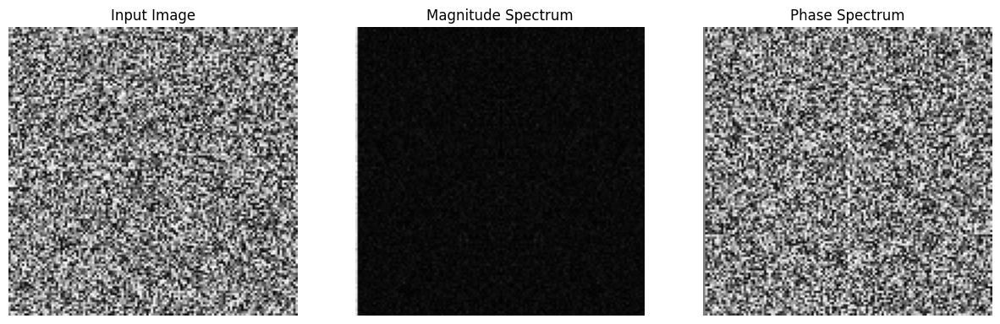

In [18]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Visualization function
def visualize_fourier_features(image_input, embed_dim=64):
    # Ensure the image_input is a 3D tensor (height, width, channels)
    if len(image_input.shape) != 3:
        raise ValueError("Input image must be a 3D tensor with shape (height, width, channels).")

    # FFT computation
    fft_result = tf.signal.fft2d(tf.cast(image_input, tf.complex64))
    magnitude = tf.abs(fft_result)
    phase = tf.math.angle(fft_result)

    # Print shapes for debugging
    print(f"FFT Shape: {fft_result.shape}")
    print(f"Magnitude Shape: {magnitude.shape}")
    print(f"Phase Shape: {phase.shape}")

    # Prepare for visualization
    output_image_np = tf.squeeze(image_input).numpy()  # Convert tensor to numpy and remove dimensions
    magnitude_np = tf.squeeze(magnitude).numpy()
    phase_np = tf.squeeze(phase).numpy()

    # Normalize magnitude for better visibility
    magnitude_np = magnitude_np / tf.reduce_max(magnitude_np)

    # Plotting the results
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    ax[0].imshow(output_image_np, cmap='gray')  # Assuming the image is grayscale
    ax[0].set_title('Input Image')
    ax[0].axis('off')

    ax[1].imshow(magnitude_np, cmap='gray')
    ax[1].set_title('Magnitude Spectrum')
    ax[1].axis('off')

    ax[2].imshow(phase_np, cmap='gray')
    ax[2].set_title('Phase Spectrum')
    ax[2].axis('off')

    plt.show()

# Assuming `image` is your input image tensor with shape (height, width, channels)
# Example input
image = tf.random.uniform((128, 128, 1))  # Replace with your actual image tensor
visualize_fourier_features(image, embed_dim=64)


Image tensor shape: (1, 224, 224, 3)


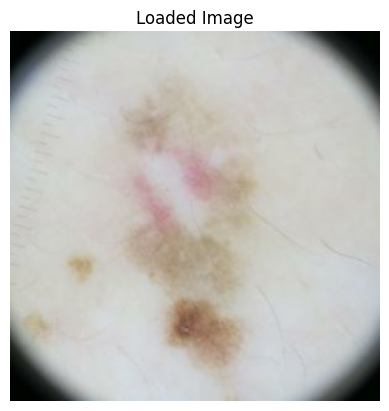

In [16]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load and preprocess the specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10535.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32) / 255.0  # Convert to float32 and normalize

# Now 'image' is a tensor ready for processing
print(f"Image tensor shape: {image.shape}")

# Optional: Display the image to verify it has been loaded correctly
plt.imshow(tf.squeeze(image))  # Remove the batch dimension for visualization
plt.title('Loaded Image')
plt.axis('off')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.1415927..3.1415927].


FFT Shape: (224, 224, 3)
Magnitude Shape: (224, 224, 3)
Phase Shape: (224, 224, 3)


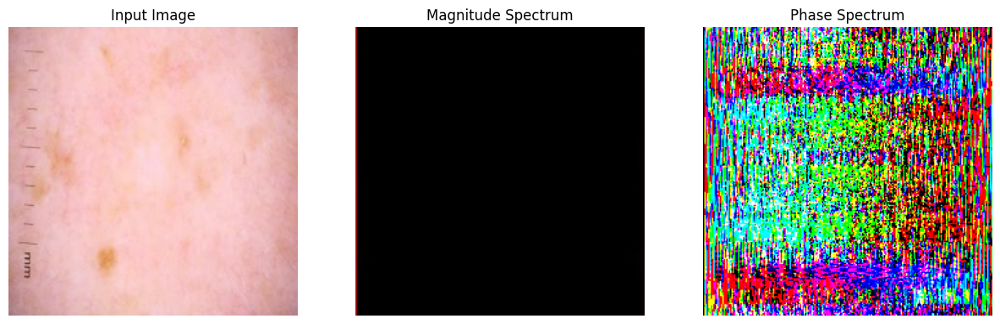

In [22]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load and preprocess the specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign/melanoma_995.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.expand_dims(image, axis=0)  # Add batch dimension
image = tf.cast(image, tf.float32) / 255.0  # Convert to float32 and normalize

# Visualization function
def visualize_fourier_features(image_input, embed_dim=64):
    # Ensure the image_input is a 3D tensor (height, width, channels)
    if len(image_input.shape) != 3:
        raise ValueError("Input image must be a 3D tensor with shape (height, width, channels).")

    # FFT computation
    fft_result = tf.signal.fft2d(tf.cast(image_input, tf.complex64))
    magnitude = tf.abs(fft_result)
    phase = tf.math.angle(fft_result)

    # Print shapes for debugging
    print(f"FFT Shape: {fft_result.shape}")
    print(f"Magnitude Shape: {magnitude.shape}")
    print(f"Phase Shape: {phase.shape}")

    # Prepare for visualization
    output_image_np = tf.squeeze(image_input).numpy()  # Convert tensor to numpy and remove dimensions
    magnitude_np = tf.squeeze(magnitude).numpy()
    phase_np = tf.squeeze(phase).numpy()

    # Normalize magnitude for better visibility
    magnitude_np = magnitude_np / tf.reduce_max(magnitude_np)

    # Plotting the results
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    ax[0].imshow(output_image_np)  # Assuming the image is RGB
    ax[0].set_title('Input Image')
    ax[0].axis('off')

    ax[1].imshow(magnitude_np, cmap='gray')
    ax[1].set_title('Magnitude Spectrum')
    ax[1].axis('off')

    ax[2].imshow(phase_np, cmap='gray')
    ax[2].set_title('Phase Spectrum')
    ax[2].axis('off')

    plt.show()

# Remove the batch dimension before visualization
image_3d = tf.squeeze(image)  # This gives you a 3D tensor with shape (height, width, channels)

# Call the visualization function
visualize_fourier_features(image_3d, embed_dim=64)
